# Energy Consumption heatmap of the Rotterdam-Duisburg corridor, based on AIS
- This notebook contains energy consumption and emission calculation methods for inland vessels
- It starts with different codes to fill in missing values and to enrich the dataset (e.g. filling in missing length or width values, and estimate the RWS vessel class, to subsequently estimate the installed power of the ship)
- For each timestamp in the AIS dataset, the corresponding emission of that emission is calculated
- The emission is visualized on the network
##### Thesis work of Nils Kok

## 1. Load useful packages

In [1]:
# This file has some  specific requirements.
# To make sure it works you can setup a virtualenvironment with the requirements.txt in this folder 
# From a command line interface in the notebooks folder you can do:
# pip install -r requirm0ements.txt

# general 
import pickle
#import python_utils
# needed to read your environment variable
import os
import glob
import folium
from folium import plugins
from colorcet import fire
from datashader import transfer_functions as tf
# For opening local files
import pathlib
from holoviews.element.tiles import StamenTerrain

#geometry 
import shapely.geometry
import numpy as np
import pyproj 

# Test connection
# Make sure you have pip  install  azure-storage-blob==2.1.0 installed
# Do not install 12.1. this is not compatible yet with adlfs
# See https://github.com/dask/adlfs/issues/15
import azure.storage.blob

# this module loads dataframes in parallel
# requires pip install dask[complete] and fastparquet  and python-snappy
import dask.dataframe as dd
import pandas as pd
import geopandas
import movingpandas as mpd
import datetime

# this is  for plotting
import matplotlib.pyplot as plt
%matplotlib inline

# for advanced plotting
import datashader as ds
from holoviews.operation.datashader import datashade, dynspread,  rasterize
import holoviews as hv
hv.extension('bokeh')

# this is for environmental variables for secrets (needs python-dotenv)
# You can copy the  .env.example file and rename it to .env (one directory  up from the notebooks)
# 
%load_ext dotenv
# Load environment variables from the .env file 1 directory up
%dotenv -v

# This should print 2.1.0
from distributed import Client
client = Client()
azure.storage.blob.__version__
client

ModuleNotFoundError: No module named 'colorcet'

## 2. Load (pre-processed) data from the cloud

In [145]:
# Connect to the blob storage 
# Specify the foldername 
foldername = 'parquet/2019080910_rotduisburg_trajs'

# Read the environment variable from the  .env file
sas_token = os.environ['AZURE_BLOB_SAS_TOKEN']
# This is the 2.1 version.  if the  BlockBlobService is missing, you probably installed a later version
service = azure.storage.blob.BlockBlobService(sas_token=sas_token, account_name='rwsais')
print('Found {} files in container'.format(len(service.list_blobs('ais/',  prefix=foldername).items)))
blob = next(iter(service.list_blobs('ais',  prefix=foldername)))

Found 101 files in container


In [146]:
from numba.experimental import jitclass

In [147]:
## Load the saved data (from azure cloud)

first_file_number = 0
number_of_files = 1

# Rotterdam Duisburg
container_name = 'ais'
folder_name = 'parquet/2019080910_rotduisburg_trajs'

# Create file list
filenames_list = []
for ifile in range(first_file_number, first_file_number+number_of_files):
    filenames_list.append(os.path.join('abfs://', container_name, folder_name, 'part.{}.parquet'.format(ifile)).replace("\\","/"))

pathname = filenames_list
ddf = dd.read_parquet(pathname, storage_options={"account_name": "rwsais", "sas_token": sas_token})

In [148]:
%%time

# Create geopandas dataframe
df = ddf[['latitude', 'longitude', 'name', 'vesseltypeERI',
          'sog', 'cog', 'length', 'width', 'draughtInland',
          'vesseltype', 'timestamplast',]].compute()
df = geopandas.geodataframe.GeoDataFrame(df, geometry=geopandas.points_from_xy(df.longitude, df.latitude), crs="EPSG:4326")

Wall time: 29.2 s


In [149]:
# Remove duplicates
df = df.set_index('timestamplast')
df.rename(columns={"name": "shipname"}, inplace=True)
old_nr_of_entries = len(df)
df.drop_duplicates(subset=['shipname', 'latitude', 'longitude'], keep='first', inplace=True)
print("Reduced from {} to {} rows after removing duplicates".format(old_nr_of_entries, len(df)))

Reduced from 457917 to 301621 rows after removing duplicates


In [150]:
# Remove zero sog speed records
print("Original size: {} rows".format(len(df)))
df = df[df.sog>0]
df = df[df.sog<40]
print("Reduced to {} rows after removing zero speed records".format(len(df)))

Original size: 301621 rows
Reduced to 255284 rows after removing zero speed records


In [151]:
df[df.shipname=='testschip-2229']

,latitude,longitude,shipname,vesseltypeERI,sog,cog,length,width,draughtInland,vesseltype,geometry
timestamplast,,,,,,,,,,,
2019-08-01 00:58:45+00:00,52.037201,5.111430,testschip-2229,8022,6.9,163.399994,NaN,11.0,1.0,80,POINT (5.11143 52.03720)
2019-08-01 00:58:56+00:00,52.036861,5.111580,testschip-2229,8022,6.7,164.800003,NaN,11.0,1.0,80,POINT (5.11158 52.03686)
2019-08-01 00:59:06+00:00,52.036564,5.111715,testschip-2229,8022,6.6,165.100006,NaN,11.0,1.0,80,POINT (5.11171 52.03656)
2019-08-01 00:59:16+00:00,52.036270,5.111840,testschip-2229,8022,6.5,165.399994,NaN,11.0,1.0,80,POINT (5.11184 52.03627)
2019-08-01 00:59:26+00:00,52.036003,5.111945,testschip-2229,8022,6.4,165.199997,NaN,11.0,1.0,80,POINT (5.11195 52.03600)
...,...,...,...,...,...,...,...,...,...,...,...
2019-08-01 14:20:01+00:00,51.410141,4.237665,testschip-2229,8022,8.7,172.500000,NaN,11.0,1.0,80,POINT (4.23767 51.41014)
2019-08-01 14:20:22+00:00,51.409302,4.237870,testschip-2229,8022,8.7,171.699997,NaN,11.0,1.0,80,POINT (4.23787 51.40930)
2019-08-01 14:20:31+00:00,51.408981,4.237935,testschip-2229,8022,8.7,172.300003,NaN,11.0,1.0,80,POINT (4.23794 51.40898)


### 2.1 Filter data

In [152]:
# Filter out extreme high velocities (> 8 m/s)
# df_filt = df[df.speed < 8]
df_filt = df
df_filt.head()

,latitude,longitude,shipname,vesseltypeERI,sog,cog,length,width,draughtInland,vesseltype,geometry
timestamplast,,,,,,,,,,,
2019-08-01 00:00:00+00:00,51.904839,4.564657,testschip-23,0,11.7,283.299988,NaN,NaN,NaN,0,POINT (4.56466 51.90484)
2019-08-01 00:00:00+00:00,51.819862,5.058390,testschip-125,0,3.6,59.000000,NaN,NaN,NaN,0,POINT (5.05839 51.81986)
2019-08-01 00:00:01+00:00,51.977894,5.281323,testschip-153,0,8.1,113.199997,NaN,NaN,NaN,0,POINT (5.28132 51.97789)
2019-08-01 00:00:01+00:00,51.888657,5.720250,testschip-198,0,9.4,299.899994,NaN,NaN,NaN,0,POINT (5.72025 51.88866)
2019-08-01 00:00:01+00:00,51.813480,5.141880,testschip-201,0,5.7,83.099998,NaN,NaN,NaN,0,POINT (5.14188 51.81348)


### 2.2 Create a df with other projection and create heatmap based on geographical positions

In [153]:
%%time
# Change projection to EPSG:3857
df_proj = df_filt.to_crs("EPSG:3857").copy()

Wall time: 11.6 s


In [154]:
%%time

currdate = df_proj.index[0]

# Create a df of 1 day
upbound = pd.to_datetime(currdate.date(), utc=True) + datetime.timedelta(days=1) # first date, current date + 1 day
lowbound = pd.to_datetime(currdate.date(), utc=True) - datetime.timedelta(days=1) # current date - 1 day
df_proj = df_proj[(df_proj.index>lowbound) & (df_proj.index<upbound)].copy()
df_proj['x'] = df_proj.geometry.x
df_proj['y'] = df_proj.geometry.y

Wall time: 6.8 s


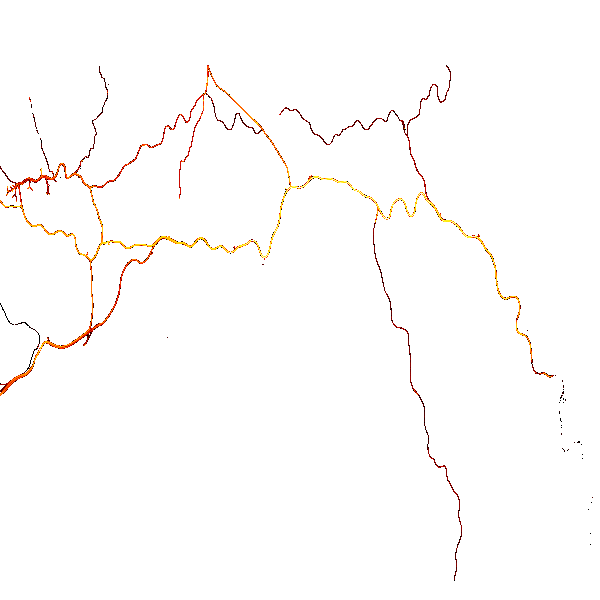

In [155]:
xrange = (472238.1707879485, 752412.1077724853)
yrange = (6689373.908548749, 6821302.196791419)

agg = ds.Canvas(x_range=xrange, y_range=yrange).points(df_proj, 'x', 'y')
tf.set_background(tf.shade(agg, cmap=fire), None) # None = transparant background

## 3. Code to estimate the RWS vessel class

In [156]:
df_day = df_filt.copy()

#### 3.1 Filter small ships, vessels that are not inland vessels and vessels with unknown width ánd length

In [157]:
# First change all the NaN values in the width and length columns to zero floats

df_day['width'] = df_day['width'].fillna(0)
df_day['length'] = df_day['length'].fillna(0)

In [158]:
# We filter out the rows that have a missing length and width
df_day['sum L + B'] = df_day['width'] + df_day['length'] 

In [159]:
df_day = df_day[df_day['sum L + B'] > 0.0]

In [160]:
# We give the vesseltypeERI's with value 0 (unknown), the value 8000 (unknown)
df_day['vesseltypeERI'] = df_day['vesseltypeERI'].where(df_day['vesseltypeERI'] != 0, 8000) 
df_day['vesseltypeERI'] = df_day['vesseltypeERI'].where(df_day['vesseltypeERI'] != 8510, 8000) #8510 = object, not further specified

# Filter out all vessels which are not inland vessels (first digit '8' indicates inland shipping)
df_day = df_day[df_day.vesseltypeERI >= 8000]

#### 3.2 Subdivide vessels into 'motor vessels', 'barges', 'convoys'

In [161]:
# Add 2 columns: 
# (1) vessel type (default value: unknown, later on we will specify)
# (2) RWS classification (default value: unknown, later on filled in based on 'estimation code')

df_day.insert(11, "vessel type", "unknown", True)
df_day.insert(12, "RWS classification", "unknown", True)

df_day.head()

,latitude,longitude,shipname,vesseltypeERI,sog,cog,length,width,draughtInland,vesseltype,geometry,vessel type,RWS classification,sum L + B
timestamplast,,,,,,,,,,,,,,
2019-08-01 00:00:12+00:00,51.681717,4.393350,testschip-356,8022,9.7,44.400002,85.0,11.0,NaN,80,POINT (4.39335 51.68172),unknown,unknown,96.0
2019-08-01 00:00:23+00:00,51.682030,4.393837,testschip-356,8022,9.6,45.500000,85.0,11.0,NaN,80,POINT (4.39384 51.68203),unknown,unknown,96.0
2019-08-01 00:00:27+00:00,51.863365,6.069932,testschip-649,8260,9.2,303.799988,193.0,35.0,1.8,79,POINT (6.06993 51.86337),unknown,unknown,228.0
2019-08-01 00:00:31+00:00,51.682308,4.394312,testschip-356,8022,9.6,45.000000,85.0,11.0,NaN,80,POINT (4.39431 51.68231),unknown,unknown,96.0
2019-08-01 00:00:34+00:00,51.815365,5.152322,testschip-201,8000,5.9,71.099998,270.0,23.0,NaN,79,POINT (5.15232 51.81536),unknown,unknown,293.0


<AxesSubplot:>

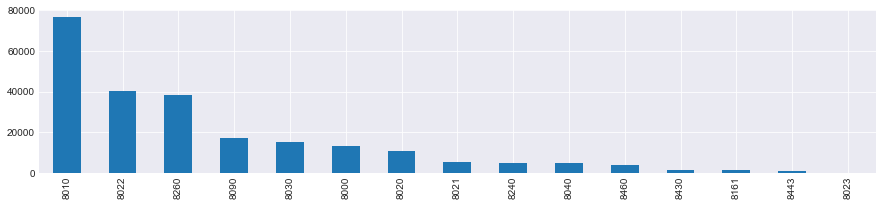

In [162]:
df_day['vesseltypeERI'].value_counts().plot(kind='bar', figsize=(15,3))

In [163]:
# Information from: https://www.ccr-zkr.org/files/documents/ris/ais_installguidelines_nl.pdf

# All motor vessels
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8010, 'motor vessel') # Motor freighter, general cargo
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8020, 'motor vessel') # Motor tanker, liquid cargo
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8021, 'motor vessel') # Motor tanker, liquid cargo, type N
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8022, 'motor vessel') # Motor tanker, liquid cargo, type C
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8023, 'motor vessel') # Motor tanker, dry cargo asif liquid
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8030, 'motor vessel') # Container vessel
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8040, 'motor vessel') # Gas tanker
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8400, 'motor vessel') # Tug, single
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8420, 'motor vessel') # Tug, assisting a vessel
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8440, 'motor vessel') # Passenger ship, ferry, cruise
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8441, 'motor vessel') # Ferry
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8442, 'motor vessel') # Red cross ship
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8443, 'motor vessel') # Cruise ship
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8444, 'motor vessel') # Passenger ship without accomodation
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8450, 'motor vessel') # Service vessel
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8460, 'motor vessel') # Vessel, work maintainance craft, dredge.. 
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8480, 'motor vessel') # Fishing boat
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8490, 'motor vessel') # Bunker ship

# All barges
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8150, 'barge') # freightbarge
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8160, 'barge') # tankbarge
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8161, 'barge') # tankbarge, liquid cargo, type N
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8162, 'barge') # tankbarge, liquid cargo, type C
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8163, 'barge') # tankbarge, dry barge as if liquid
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8170, 'barge') # freightbarge with containers
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8210, 'barge') # one cargo barges
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8220, 'barge') # two cargo barges
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8230, 'barge') # three cargo barges
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8240, 'barge') # four cargo barges
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8250, 'barge') # five cargo barges
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8260, 'barge') # six cargo barges
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8270, 'barge') # seven cargo barges
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8280, 'barge') # eight cargo barges
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8290, 'barge') # nine cargo barges
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8310, 'barge') # pushtow, one tank/gas barge
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8430, 'barge') # Pushboat, single
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8500, 'barge') # barge, tanker, chemical

# All convoys
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8050, 'convoy') # Motor freighter, tug
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8060, 'convoy') # Motor tanker, tug
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8070, 'convoy') # Motor freighter with one or more ships alongside
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8080, 'convoy') # Motor freighter with tanker
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8090, 'convoy') # Motor freighter pusing one or more freighters
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8100, 'convoy') # Motor freighter pushing at least 1 tank ship
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8110, 'convoy') # Tug, freighter
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8120, 'convoy') # Tug, tanker
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8130, 'convoy') # Tug freighter, coupled
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8140, 'convoy') # Tug, freighter / tanker, coupled
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8410, 'convoy') # Tug, one or more tows
df_day['vessel type'] = df_day['vessel type'].where(df_day['vesseltypeERI'] != 8470, 'convoy') # Object, towed, not otherwise specified


#### 3.3 Code to fill in missing values based on the information you have

In [164]:
import random
pd.options.mode.chained_assignment = None

In [165]:
df_day.head()

,latitude,longitude,shipname,vesseltypeERI,sog,cog,length,width,draughtInland,vesseltype,geometry,vessel type,RWS classification,sum L + B
timestamplast,,,,,,,,,,,,,,
2019-08-01 00:00:12+00:00,51.681717,4.393350,testschip-356,8022,9.7,44.400002,85.0,11.0,NaN,80,POINT (4.39335 51.68172),motor vessel,unknown,96.0
2019-08-01 00:00:23+00:00,51.682030,4.393837,testschip-356,8022,9.6,45.500000,85.0,11.0,NaN,80,POINT (4.39384 51.68203),motor vessel,unknown,96.0
2019-08-01 00:00:27+00:00,51.863365,6.069932,testschip-649,8260,9.2,303.799988,193.0,35.0,1.8,79,POINT (6.06993 51.86337),barge,unknown,228.0
2019-08-01 00:00:31+00:00,51.682308,4.394312,testschip-356,8022,9.6,45.000000,85.0,11.0,NaN,80,POINT (4.39431 51.68231),motor vessel,unknown,96.0
2019-08-01 00:00:34+00:00,51.815365,5.152322,testschip-201,8000,5.9,71.099998,270.0,23.0,NaN,79,POINT (5.15232 51.81536),unknown,unknown,293.0


##### 3.3.1 Filling in missing 'width' values based on the given length 

In [166]:
%%time

df_day['new_ship'] = 'no'

df_day['new_ship'][0] = 'yes'

Wall time: 11.4 ms


In [167]:
%%time

for i in range(len(df_day) - 1):
    if df_day.shipname.iloc[i+1] != df_day.shipname.iloc[i]:
        df_day.new_ship.iloc[i+1] = 'yes'

Wall time: 3min 43s


In [168]:
df_day.head(200)

,latitude,longitude,shipname,vesseltypeERI,sog,cog,length,width,draughtInland,vesseltype,geometry,vessel type,RWS classification,sum L + B,new_ship
timestamplast,,,,,,,,,,,,,,,
2019-08-01 00:00:12+00:00,51.681717,4.393350,testschip-356,8022,9.7,44.400002,85.0,11.0,NaN,80,POINT (4.39335 51.68172),motor vessel,unknown,96.0,yes
2019-08-01 00:00:23+00:00,51.682030,4.393837,testschip-356,8022,9.6,45.500000,85.0,11.0,NaN,80,POINT (4.39384 51.68203),motor vessel,unknown,96.0,no
2019-08-01 00:00:27+00:00,51.863365,6.069932,testschip-649,8260,9.2,303.799988,193.0,35.0,1.80,79,POINT (6.06993 51.86337),barge,unknown,228.0,yes
2019-08-01 00:00:31+00:00,51.682308,4.394312,testschip-356,8022,9.6,45.000000,85.0,11.0,NaN,80,POINT (4.39431 51.68231),motor vessel,unknown,96.0,yes
2019-08-01 00:00:34+00:00,51.815365,5.152322,testschip-201,8000,5.9,71.099998,270.0,23.0,NaN,79,POINT (5.15232 51.81536),unknown,unknown,293.0,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-08-01 00:03:37+00:00,51.823334,5.292172,testschip-670,8010,6.2,65.000000,135.0,18.0,1.74,79,POINT (5.29217 51.82333),motor vessel,unknown,153.0,yes
2019-08-01 00:03:37+00:00,51.473511,4.225255,testschip-1677,8010,10.8,182.600006,86.0,9.0,0.02,79,POINT (4.22526 51.47351),motor vessel,unknown,95.0,yes
2019-08-01 00:03:37+00:00,51.901127,5.579575,testschip-574,8260,4.0,100.199997,264.0,23.0,2.70,79,POINT (5.57958 51.90113),barge,unknown,287.0,yes


In [169]:
def identify_new_ship_no_width(row):
    if row['new_ship'] == 'yes':
        if row['width'] == 0.0:
            return 'new ship no width'
        else:
            return row['width']
    else:
        return row['width']

In [170]:
%%time 

df_day['width'] = df_day.apply(identify_new_ship_no_width, axis = 1)

Wall time: 4.91 s


In [171]:
def missing_width_values(row):
    if row['width'] == 'new ship no width':
            # If we know from vesseltypeERI that we consider a motor vessel
            # We assume for now that an unknown vessel type = a motor vessel

        if row['vessel type'] == 'motor vessel' or row['vessel type'] == 'unknown' : 

            if row['length'] <= 38:
                return 5             # assumed width M0
            if 38 < row['length'] <= 50:
                return 5.05          # width M1
            if 50 < row['length'] <= 55:
                return 6.6           # width M2
            if 55 < row['length'] <= 70:
                return 7.2           # width M3
            if 70 < row['length'] <= 86:
                random1 = random.randint(0,2)
                if random1 == 0:
                    return 9.5           # width M6
                else:
                    return 8.2           # width M4, M5
            if 86 < row['length'] <= 105:
                return 9.5               # width M7
            if 105 < row['length'] <= 111:
                random2 = random.randint(0,1)
                if random2 == 0:
                    return 11.4      # width M8
                else:
                    return 13.5      # width M10
            if row['length'] > 111:
                random3 = random.randint(0,2)
                if random3 == 0:
                    return 11.4      # width M9
                if random3 == 1: 
                    return 14.20     # width M11
                else:
                    return 17        # width M12

        # If we know from vesseltypeERI that we consider a barge     

        if row['vessel type'] == 'barge':
            if row['length'] <= 55:
                return 5.2              # width B01
            if 55 < row['length'] <= 70:
                return 6.6              # width B02
            if 70 < row['length'] <= 80:
                return 7.5             # width B03
            if 80 < row['length'] <= 85:
                return 8.2             # width B04
            if 85 < row['length'] <= 105:
                return 9.5             # width BI
            if 105 < row['length'] <= 135:
                random4 = random.randint(0,1)
                if random4 == 0:
                    return 11.4            # width BII-1
                else:
                    return 22.8            # width BII-2b
            if 135 < row['length'] <= 146:
                return 22.8                # width BII-2b
            if 146 < row['length'] <= 200:
                if row['vesseltypeERI'] == 8230:
                    return 22.8            # width BII-4 (3 barges)
                if row['vesseltypeERI'] == 8240:
                    return 22.8            # width BII-4
                if row['vesseltypeERI'] == 8250:
                    return 34.2            # width BII-6b (5 barges)
                if row['vesseltypeERI'] == 8260:
                    return 34.2            # width BII-6b
                else:
                    random5 = random.randint(0,1)
                    if random5 == 0:
                        return 22.8       # width BII-4
                    else:
                        return 34.2       # width BII-6b
            if row['length'] > 200:
                return 22.8               # width BII-6l 

        # If we know from vesseltypeERI that we consider a convoy

        if row['vessel type'] == 'convoy':
            if row['length'] <= 76:
                return 10.1             # width C1b
            if 76 < row['length'] <= 85:
                return 5.05            # width C1l
            if 85 < row['length'] <= 136:
                random6 = random.randint(0,1)
                if random6 == 0:
                    return 19         # width C2b
                else:
                    return 22.8       # width C3b
            if row['length'] > 136:
                random7 = random.randint(0,2)
                if random7 == 0:
                    return 9.5       # width C2l
                if random7 == 1:
                    return 11.4      # width C3l
                else:
                    return 22.8      # Width C4
    else:
        return row['width']

In [172]:
%%time

df_day['width'] = df_day.apply(missing_width_values, axis = 1)

Wall time: 5.09 s


In [173]:
%%time

# For all the other datapoints of the same ship, the estimated width is adopted
for i in range(len(df_day) - 1):
    if df_day['width'].iloc[i+1] == 0.0:
        df_day['width'].iloc[i+1] = df_day['width'].iloc[i]

Wall time: 2.98 s


In [174]:
df_day.head()

,latitude,longitude,shipname,vesseltypeERI,sog,cog,length,width,draughtInland,vesseltype,geometry,vessel type,RWS classification,sum L + B,new_ship
timestamplast,,,,,,,,,,,,,,,
2019-08-01 00:00:12+00:00,51.681717,4.393350,testschip-356,8022,9.7,44.400002,85.0,11.0,NaN,80,POINT (4.39335 51.68172),motor vessel,unknown,96.0,yes
2019-08-01 00:00:23+00:00,51.682030,4.393837,testschip-356,8022,9.6,45.500000,85.0,11.0,NaN,80,POINT (4.39384 51.68203),motor vessel,unknown,96.0,no
2019-08-01 00:00:27+00:00,51.863365,6.069932,testschip-649,8260,9.2,303.799988,193.0,35.0,1.8,79,POINT (6.06993 51.86337),barge,unknown,228.0,yes
2019-08-01 00:00:31+00:00,51.682308,4.394312,testschip-356,8022,9.6,45.000000,85.0,11.0,NaN,80,POINT (4.39431 51.68231),motor vessel,unknown,96.0,yes
2019-08-01 00:00:34+00:00,51.815365,5.152322,testschip-201,8000,5.9,71.099998,270.0,23.0,NaN,79,POINT (5.15232 51.81536),unknown,unknown,293.0,yes


##### 3.3.2 Filling in missing 'length' values based on the given width

In [175]:
def identify_new_ship_no_length(row):
    if row['new_ship'] == 'yes':
        if row['length'] == 0.0:
            return 'new ship no length'
        else:
            return row['length']
    else:
        return row['length']

In [176]:
%%time 

df_day['length'] = df_day.apply(identify_new_ship_no_length, axis = 1)

Wall time: 4.78 s


In [177]:
def missing_length_values(row):
    if row['length'] == 'new ship no length':
        
            # If we know from vesseltypeERI that we consider a motor vessel
            # We assume for now that an unknown vessel type = a motor vessel

        if row['vessel type'] == 'motor vessel' or row['vessel type'] == 'unknown' : 

            if row['width'] <= 5.00:
                return 30             # assumed length M0
            if 5.00 < row['width'] <= 5.10:
                return 38.5          # length M1
            if 5.10 < row['width'] <= 6.70:
                return 52.5           # length M2
            if 6.70 < row['width'] <= 7.30:
                return 62.5           # length M3
            if 7.30 < row['width'] <= 8.30:
                random8 = random.randint(0,1)
                if random8 == 0:
                    return 67        # length M4
                else:
                    return 82.5      # length M5
            if 8.30 < row['width'] <= 9.60:
                random9 = random.randint(0,1)
                if random9 == 0:
                    return 82.5       # length M6
                else:
                    return 105        # length M7
            if 9.60 < row['width'] <= 11.50:
                random10 = random.randint(0,1)
                if random10 == 0:
                    return 110        # length M8
                else:
                    return 135        # length M9
            if 11.50 < row['width'] <= 14.30:
                random11 = random.randint(0,1)
                if random11 == 0:
                    return 110        # length M10
                else:
                    return 135        # length M11
            if row['width'] > 14.30:
                return 135            # length M12
                


        # If we know from vesseltypeERI that we consider a barge     

        if row['vessel type'] == 'barge':
            if row['width'] <= 5.2:
                return 55              # length B01
            if 5.2 < row['width'] <= 6.7:
                return 65              # length B02
            if 6.7 < row['width'] <= 7.6:
                return 80              # length B03
            if 7.6 < row['width'] <= 8.4:
                return 85              # length B04
            if 8.4 < row['width'] <= 9.6:
                return 95              # length BI
            if 9.6 < row['width'] <= 15.1:
                random12 = random.randint(0,1)
                if random12 == 0:
                    return 102.5           # length BII-1
                else:
                    return 180             # length BII-2l
            if 15.1 < row['width'] <= 24:
                if row['vesseltypeERI'] == 8220:
                    return 120            # length BII-2b (2 barges)
                if row['vesseltypeERI'] == 8230:
                    return 190            # length BII-4 (3 barges)
                if row['vesseltypeERI'] == 8240:
                    return 190            # length BII-4
                if row['vesseltypeERI'] == 8250:
                    return 270            # length BII-6l (5 barges)
                if row['vesseltypeERI'] == 8260:
                    return 270            # length BII-6l
                else:
                    random13 = random.randint(0,2)
                    if random13 == 0:
                        return 120       # length BII-2b
                    if random13 == 1:
                        return 190       # length BII-4
                    if random13 == 2:
                        return 270       # length BII-6l
            if row['width'] > 24:
                return 195               # length BII-6b 

        # If we know from vesseltypeERI that we consider a convoy

        if row['vessel type'] == 'convoy':
            if row['width'] <= 5.1:
                return 79             # length C1l
            if 5.1 < row['width'] <= 9.6:
                return 177.5          # length C2l
            if 9.6 < row['width'] <= 12.6:
                random14 = random.randint(0,1)
                if random14 == 0:
                    return 38.5       # length C1b
                else:
                    return 180        # width C3l
            if 12.6 < row['width'] <= 19.1:
                return 95        # length C2b
            if 19.1 < row['width'] <= 25:
                random15 = random.randint(0,1)
                if random15 == 0:
                    return 102.5     # length C3b
                else:
                    return 185        # length C4
    else:
        return row['length']

In [178]:
%%time

df_day['length'] = df_day.apply(missing_length_values, axis = 1)

Wall time: 5.08 s


In [179]:
%%time

# For all the other datapoints of the same ship, the estimated length is adopted
for i in range(len(df_day) - 1):
    if df_day['length'].iloc[i+1] == 0.0:
        df_day['length'].iloc[i+1] = df_day['length'].iloc[i]

Wall time: 3.02 s


In [180]:
df_day.head()

,latitude,longitude,shipname,vesseltypeERI,sog,cog,length,width,draughtInland,vesseltype,geometry,vessel type,RWS classification,sum L + B,new_ship
timestamplast,,,,,,,,,,,,,,,
2019-08-01 00:00:12+00:00,51.681717,4.393350,testschip-356,8022,9.7,44.400002,85.0,11.0,NaN,80,POINT (4.39335 51.68172),motor vessel,unknown,96.0,yes
2019-08-01 00:00:23+00:00,51.682030,4.393837,testschip-356,8022,9.6,45.500000,85.0,11.0,NaN,80,POINT (4.39384 51.68203),motor vessel,unknown,96.0,no
2019-08-01 00:00:27+00:00,51.863365,6.069932,testschip-649,8260,9.2,303.799988,193.0,35.0,1.8,79,POINT (6.06993 51.86337),barge,unknown,228.0,yes
2019-08-01 00:00:31+00:00,51.682308,4.394312,testschip-356,8022,9.6,45.000000,85.0,11.0,NaN,80,POINT (4.39431 51.68231),motor vessel,unknown,96.0,yes
2019-08-01 00:00:34+00:00,51.815365,5.152322,testschip-201,8000,5.9,71.099998,270.0,23.0,NaN,79,POINT (5.15232 51.81536),unknown,unknown,293.0,yes


#### 3.4 Code to estimate vessel class (based on Richtlijnen Vaarwegen 2020)

In [181]:
def estimate_vessel_class(row):
    if row['vessel type'] == 'motor vessel': # If the vessel is for sure a motor vessel
        if row['length'] <= 38 or row['width'] <= 5.00:
            return 'M0'
        
        else:
            if 5.00 < row['width'] <= 5.10:
                return 'M1'
            if 5.10 < row['width'] <= 6.70:
                return 'M2'
            if 6.70 < row['width'] <= 7.30:
                return 'M3'
            if 7.30 < row['width'] <= 8.30:
                if row['length'] <= 74:
                    return 'M4'
                else:
                    return 'M5'
            if 8.30 < row['width'] <= 9.60:
                if row['length'] <= 86:
                    return 'M6'
                else:
                    return 'M7'
            if 9.60 < row['width'] <= 11.50:
                if row['length'] <= 111:
                    return 'M8'
                else:
                    return 'M9'
            if 11.50 < row['width'] <= 14.30:
                if row['length'] <= 111:
                    return 'M10'
                else:
                    return 'M11'
            if row['width'] > 14.30:
                return 'M12'
    
    if row['vessel type'] == 'barge': # If the vessel is for sure a barge type
        if row['width'] <= 5.20:
            return 'B01'
        if 5.20 < row['width'] <= 6.70:
            return 'B02'
        if 6.70 < row['width'] <= 7.60:
            return 'B03'
        if 7.60 < row['width'] <= 8.40:
            return 'B04'
        if 8.40 < row['width'] <= 9.60:
            return 'BI'
        if 9.60 < row['width'] <= 15.10:
            if row['length'] <= 146:
                return 'BII-1'
            else:
                return 'BII-2l'
        if 15.10 < row['width'] <= 24:
            if row['length'] <= 146:
                return 'BII-2b'
            if 146 < row['length'] <= 200:
                return 'BII-4'
            else:
                return 'BII-6l'
        if row['width'] > 24:
            return 'BII-6b'
            
    if row['vessel type'] == 'convoy': #If the vessel is for sure a convoy
        if row['width'] <= 5.10:
            return 'C1l'
        if 5.10 < row['width'] <= 9.60:
            return 'C2l'
        if 9.60 < row['width'] <= 12.60:
            if row['length'] <= 80:
                return 'C1b'
            else:
                return 'C3l'
        if 12.60 < row['width'] <= 19.10:
            if row['length'] <= 136:
                return 'C2b'
            else:
                return 'C4'
        if row['width'] > 19.10:
            if row['length'] <= 136:
                return 'C3b'
            else:
                return 'C4'
        
    if row['vessel type'] == 'unknown': #If the vessel is not for sure a certain type, the code is a bit more complex
        if row['length'] <= 38:
            return 'M0'
        else:
            if row['width'] <= 5.20:
                if row['length'] <= 48:
                    return 'M1'
                if 48 < row['width'] <= 65:
                    return 'B01'
                else:
                    return 'C1l'
            if 5.20 < row['width'] <= 6.70:
                if row['length'] <= 58:
                    return 'M2'
                else:
                    return 'B02'
            if 6.70 < row['width'] <= 7.60:
                if row['length'] <= 70:
                    return 'M3'
                else:
                    return 'B03'
            if 7.60 < row['width'] <= 8.40:
                if row['length'] <= 74:
                    return 'M4'
                if 74 < row['length'] <= 83:
                    return 'M5'
                else:
                    return 'B04'
            if 8.40 < row['width'] <= 9.60:
                if row['length'] <= 86:
                    return 'M6'
                if 86 < row['length'] <= 100:
                    return 'BI'
                if 100 < row['length'] <= 170:
                    return 'M7'
                else: # > 170
                    return 'C2l'                
            if 9.60 < row['width'] <= 15.10:
                if row['length'] <= 80:
                    return 'C1b'
                if 80 < row['length'] <= 105:
                    return 'BII-1'
                if 105 < row['length'] <= 115:
                    if row['width'] <= 12:
                        return 'M8'
                    else:
                        return 'M10'
                if 115 < row['length'] <= 160:
                    if row['width'] <= 12:
                        return 'M9'
                    else:
                        return 'M11'
                else:
                    if row['width'] <= 12.60:
                        return 'C3l'
                    else:
                        return 'BII-2l' #both have same dimensions, does not really matter
            if 15.10 < row['width'] <= 19.10:
                if row['length'] <= 110:
                    return 'C2b'
                else:
                    return 'M12'
            if 19.10 < row['width'] <= 24.00:
                if row['length'] <= 110:
                    return 'C3b'
                if 110 < row['length'] <= 140:
                    return 'BII-2b'
                if 140 < row['length'] <= 188:
                    return 'C4'
                if 188 < row['length'] <= 200:
                    return 'BII-4'
                else: 
                    return 'BII-6l'

            else:
                return 'BII-6b'

In [182]:
%%time

df_day['RWS classification'] = df_day.apply(estimate_vessel_class, axis = 1)
df_day.tail(758)

Wall time: 11.9 s


,latitude,longitude,shipname,vesseltypeERI,sog,cog,length,width,draughtInland,vesseltype,geometry,vessel type,RWS classification,sum L + B,new_ship
timestamplast,,,,,,,,,,,,,,,
2019-08-01 20:58:23+00:00,51.870842,5.427573,testschip-2996,8000,7.1,31.600000,135.0,12.0,NaN,99,POINT (5.42757 51.87084),unknown,M9,147.0,yes
2019-08-01 20:58:24+00:00,51.896854,5.650618,testschip-2821,8040,6.2,102.000000,106.0,11.0,2.20,80,POINT (5.65062 51.89685),motor vessel,M8,117.0,yes
2019-08-01 20:58:24+00:00,51.888519,5.488808,testschip-2665,8010,6.2,96.699997,110.0,12.0,NaN,79,POINT (5.48881 51.88852),motor vessel,M10,122.0,yes
2019-08-01 20:58:24+00:00,51.725830,4.624355,testschip-3057,8021,6.3,195.899994,80.0,8.0,2.30,80,POINT (4.62435 51.72583),motor vessel,M5,88.0,yes
2019-08-01 20:58:25+00:00,51.856747,5.956263,testschip-2818,8030,7.5,130.699997,110.0,11.0,NaN,79,POINT (5.95626 51.85675),motor vessel,M8,121.0,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-08-01 21:04:09+00:00,51.848495,6.130950,testschip-2794,8010,6.9,86.900002,135.0,14.0,2.45,79,POINT (6.13095 51.84850),motor vessel,M11,149.0,yes
2019-08-01 21:04:10+00:00,51.880684,4.450962,testschip-1124,8010,0.1,347.799988,110.0,11.0,NaN,79,POINT (4.45096 51.88068),motor vessel,M8,121.0,yes
2019-08-01 21:04:11+00:00,51.438770,4.231840,testschip-3168,8022,4.8,347.000000,110.0,12.0,NaN,80,POINT (4.23184 51.43877),motor vessel,M10,122.0,yes


#### 3.5 Show the distribution of vessel types and remove M0. Also remove other none MXX vessel types

<AxesSubplot:>

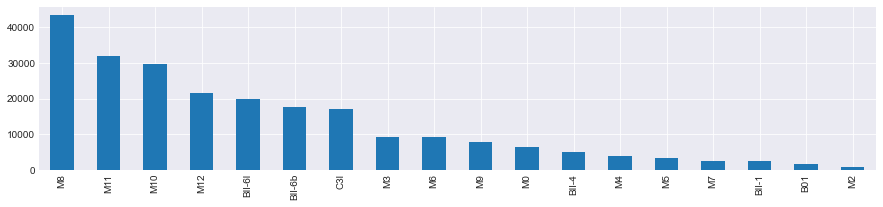

In [183]:
df_day['RWS classification'].value_counts().plot(kind='bar', figsize=(15,3))

In [184]:
# We choose to not consider M0 types of vessels in this case
df_day = df_day[df_day['RWS classification'] != 'M0']

# We apply the code only to the Mxx type of ships by filtering the other classes
df_day = df_day[df_day['RWS classification'] != 'B01']
df_day = df_day[df_day['RWS classification'] != 'B02']
df_day = df_day[df_day['RWS classification'] != 'B03']
df_day = df_day[df_day['RWS classification'] != 'B04']
df_day = df_day[df_day['RWS classification'] != 'BI']
df_day = df_day[df_day['RWS classification'] != 'BII-1']
df_day = df_day[df_day['RWS classification'] != 'BII-2l']
df_day = df_day[df_day['RWS classification'] != 'BII-2b']
df_day = df_day[df_day['RWS classification'] != 'BII-4']
df_day = df_day[df_day['RWS classification'] != 'BII-6l']
df_day = df_day[df_day['RWS classification'] != 'BII-6b']
df_day = df_day[df_day['RWS classification'] != 'C1l']
df_day = df_day[df_day['RWS classification'] != 'C1b']
df_day = df_day[df_day['RWS classification'] != 'C2l']
df_day = df_day[df_day['RWS classification'] != 'C3l']
df_day = df_day[df_day['RWS classification'] != 'C2b']
df_day = df_day[df_day['RWS classification'] != 'C3b']
df_day = df_day[df_day['RWS classification'] != 'C4']

<AxesSubplot:>

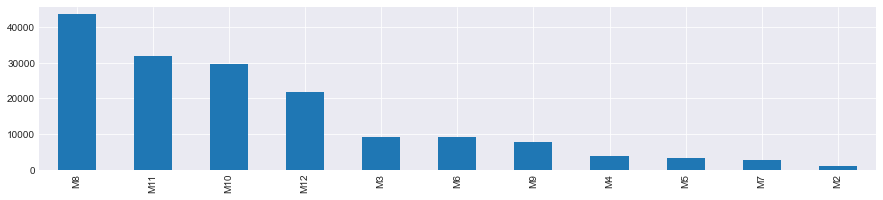

In [185]:
df_day['RWS classification'].value_counts().plot(kind='bar', figsize=(15,3))

#### 3.6 Filter large ships

In [186]:
# Filter ships that do not satisfy the CEMT-class VIIa conditions (zesbaksduwstel)
print("Original size: {} rows".format(len(df_day)))
df_day = df_day[df_day['width'] < 35]
df_day = df_day[df_day['length'] < 270]
print("Reduced to {} rows after removing large ship records".format(len(df_day)))

Original size: 163820 rows
Reduced to 163820 rows after removing large ship records


#### 3.7 Code to identify key characteristics of each vessel class (Pinstalled, Tmin, Tmax, Vtank)

In [ ]:
def class_characteristics(row):
    
    P_installed = np.nan # Installed power of vessel class
    T_min = np.nan # Minimum draft of vessel class
    T_max = np.nan # Maximum draft of vessel class
    L_w = np.nan # Weight class: L1 = 1, L2 = 2, L3 = 3
    P_stat = np.nan # Power required in stationary stage
    V_tank = np.nan # Volume tank in L
    # V_tank is scaled with P_installed. M8 is base with V = 58000 L. Other ship classes (non M) get NaN
    # Diesel Direct Drive on M8 ship has a bunker volume of 46.5 m^3,
    # Additional Engine Room space is 11.5 m^3, so total volume is 58 m^3, bron MARIN.
    
    if row['RWS classification'] == 'M0':
        P_installed = 100
        T_min = 1.2
        T_max = 2.5 # Assumed the min T and max T based on M1
        L_w = 1
        P_stat = 10
        V_tank = 58000 / 1750 * 100
    if row['RWS classification'] == 'M1':
        P_installed = 175
        T_min = 1.2
        T_max = 2.5
        L_w = 1
        P_stat = 10
        V_tank = 58000 / 1750 * 175
    if row['RWS classification'] == 'M2':
        P_installed = 300
        T_min = 1.4
        T_max = 2.6
        L_w = 1
        P_stat = 16
        V_tank = 58000 / 1750 * 300
    if row['RWS classification'] == 'M3':
        P_installed =  640
        T_min = 1.5
        T_max = 2.6
        L_w = 1
        P_stat = 33
        V_tank = 58000 / 1750 * 640
    if row['RWS classification'] == 'M4':
        P_installed =  640
        T_min = 1.5
        T_max = 2.7
        L_w = 1
        P_stat = 23
        V_tank = 58000 / 1750 * 640
    if row['RWS classification'] == 'M5':
        P_installed =  640
        T_min = 1.5
        T_max = 2.7
        L_w = 2
        P_stat = 33
        V_tank = 58000 / 1750 * 640
    if row['RWS classification'] == 'M6':
        P_installed =  1070
        T_min = 1.6
        T_max = 2.9
        L_w = 2
        P_stat = 39
        V_tank = 58000 / 1750 * 1070
    if row['RWS classification'] == 'M7':
        P_installed =  1070
        T_min = 1.6
        T_max = 3.0
        L_w = 2
        P_stat = 51
        V_tank = 58000 / 1750 * 1070
    if row['RWS classification'] == 'M8':
        P_installed =  1750
        T_min = 1.8
        T_max = 3.5
        L_w = 3
        P_stat = 65
        V_tank = 58000
    if row['RWS classification'] == 'M9':
        P_installed = 2200
        T_min = 1.8
        T_max = 3.5
        L_w = 3
        P_stat = 86
        V_tank = 58000 / 1750 * 2200
    if row['RWS classification'] == 'M10':
        P_installed =  2400
        T_min = 2.0
        T_max = 4.0
        L_w = 3
        P_stat = 81
        V_tank = 58000 / 1750 * 2400
    if row['RWS classification'] == 'M11':
        P_installed =  2400
        T_min = 2.0
        T_max = 4.0
        L_w = 3
        P_stat = 94
        V_tank = 58000 / 1750 * 2400
    if row['RWS classification'] == 'M12':
        P_installed =  3000
        T_min = 2.0
        T_max = 4.0
        L_w = 3
        P_stat = 103
        V_tank = 58000 / 1750 * 3000
    if row['RWS classification'] == 'B01':
        P_installed =  175
        T_min = 1.0
        T_max = 1.9 
        L_w = 1
        P_stat = 14
        V_tank = np.nan
    if row['RWS classification'] == 'B02':
        P_installed =  300
        T_min = 1.4
        T_max = 2.6
        L_w = 1
        P_stat = 12
        V_tank = np.nan
    if row['RWS classification'] == 'B03':
        P_installed =  300
        T_min = 1.4
        T_max = 2.6
        L_w = 1
        P_stat = 22
        V_tank = np.nan
    if row['RWS classification'] == 'B04':
        P_installed =  640
        T_min = 1.4
        T_max = 2.7
        L_w = 1
        P_stat = 25
        V_tank = np.nan
    if row['RWS classification'] == 'BI':
        P_installed =  1070
        T_min = 1.6
        T_max = 3.0
        L_w = 2
        P_stat = 29
        V_tank = np.nan
    if row['RWS classification'] == 'BII-1':
        P_installed =  1750
        T_min = 1.8
        T_max = 3.5
        L_w = 2
        P_stat = 60
        V_tank = np.nan
    if row['RWS classification'] == 'BII-2l':
        P_installed =  1750
        T_min = 2.0
        T_max = 3.8
        L_w = 3
        P_stat = 83
        V_tank = np.nan
    if row['RWS classification'] == 'BII-2b':
        P_installed =  2400
        T_min = 2.0
        T_max = 3.8
        L_w = 3
        P_stat = 102
        V_tank = np.nan
    if row['RWS classification'] == 'BII-4':
        P_installed =  3000
        T_min = 2.0
        T_max = 3.8
        L_w = 3
        P_stat = 113
        V_tank = np.nan
    if row['RWS classification'] == 'BII-6l':
        P_installed =  4000
        T_min = 2.0
        T_max = 3.8
        L_w = 3
        P_stat = 314
        V_tank = np.nan
    if row['RWS classification'] == 'BII-6b':
        P_installed =  4000
        T_min = 2.0
        T_max = 3.8
        L_w = 3
        P_stat = 314
        V_tank = np.nan
    if row['RWS classification'] == 'C1l':
        P_installed =  175
        T_min = 1.3
        T_max = 2.5
        L_w = 1
        P_stat = 6
        V_tank = np.nan
    if row['RWS classification'] == 'C1b':
        P_installed =  175
        T_min = 1.3
        T_max = 2.5
        L_w = 1
        P_stat = 9
        V_tank = np.nan
    if row['RWS classification'] == 'C2l':
        P_installed =  1070
        T_min = 1.6
        T_max = 3.0
        L_w = 2
        P_stat = 113
        V_tank = np.nan
    if row['RWS classification'] == 'C3l':
        P_installed =  1750
        T_min = 2.0
        T_max = 3.8
        L_w = 3
        P_stat = 104
        V_tank = np.nan
    if row['RWS classification'] == 'C2b':
        P_installed =  1070
        T_min = 1.6
        T_max = 3.0
        L_w = 2
        P_stat = 104
        V_tank = np.nan
    if row['RWS classification'] == 'C3b':
        P_installed =  2400
        T_min = 2.0
        T_max = 3.8
        L_w = 3
        P_stat = 51
        V_tank = np.nan
    if row['RWS classification'] == 'C4':
        P_installed =  3000
        T_min = 2.0
        T_max = 3.8
        L_w = 3
        P_stat = 203
        V_tank = np.nan

    return P_installed, T_min, T_max, L_w, P_stat, V_tank


In [188]:
%%time

df_day['characteristics'] = df_day.apply(class_characteristics, axis = 1)

Wall time: 20.9 s


In [189]:
df_day['P_installed'] = df_day.characteristics[0][0]
df_day['T_min'] = df_day.characteristics[0][1]
df_day['T_max'] = df_day.characteristics[0][2]
df_day['L_w'] = df_day.characteristics[0][3]
df_day['P_stat'] = df_day.characteristics[0][4]
df_day['V_tank'] = df_day.characteristics[0][5]

In [190]:
df_day.head(100)

,latitude,longitude,shipname,vesseltypeERI,sog,cog,length,width,draughtInland,vesseltype,...,RWS classification,sum L + B,new_ship,characteristics,P_installed,T_min,T_max,L_w,P_stat,V_tank
timestamplast,,,,,,,,,,,,,,,,,,,,,
2019-08-01 00:00:12+00:00,51.681717,4.393350,testschip-356,8022,9.7,44.400002,85.0,11.0,NaN,80,...,M8,96.0,yes,"(1750, 1.8, 3.5, 3, 65, 58000)",1750,1.8,3.5,3,65,58000
2019-08-01 00:00:23+00:00,51.682030,4.393837,testschip-356,8022,9.6,45.500000,85.0,11.0,NaN,80,...,M8,96.0,no,"(1750, 1.8, 3.5, 3, 65, 58000)",1750,1.8,3.5,3,65,58000
2019-08-01 00:00:31+00:00,51.682308,4.394312,testschip-356,8022,9.6,45.000000,85.0,11.0,NaN,80,...,M8,96.0,yes,"(1750, 1.8, 3.5, 3, 65, 58000)",1750,1.8,3.5,3,65,58000
2019-08-01 00:00:41+00:00,51.889568,5.717742,testschip-198,8010,9.5,302.200012,135.0,14.0,2.00,79,...,M11,149.0,yes,"(2400, 2.0, 4.0, 3, 94, 79542.85714285714)",1750,1.8,3.5,3,65,58000
2019-08-01 00:00:43+00:00,51.682659,4.394852,testschip-356,8022,9.5,46.200001,85.0,11.0,NaN,80,...,M8,96.0,yes,"(1750, 1.8, 3.5, 3, 65, 58000)",1750,1.8,3.5,3,65,58000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-08-01 00:03:23+00:00,51.901051,4.529795,testschip-23,8022,11.3,249.199997,135.0,12.0,2.50,80,...,M11,147.0,yes,"(2400, 2.0, 4.0, 3, 94, 79542.85714285714)",1750,1.8,3.5,3,65,58000
2019-08-01 00:03:26+00:00,51.474079,4.225165,testschip-1677,8010,10.8,182.600006,86.0,9.0,0.02,79,...,M6,95.0,yes,"(1070, 1.6, 2.9, 2, 39, 35462.857142857145)",1750,1.8,3.5,3,65,58000
2019-08-01 00:03:26+00:00,51.891491,4.229230,testschip-570,8020,0.5,350.000000,135.0,12.0,3.30,89,...,M11,147.0,yes,"(2400, 2.0, 4.0, 3, 94, 79542.85714285714)",1750,1.8,3.5,3,65,58000


### 4. Code to estimate draft values

In [191]:
# Change all the NaN values in the draft column to zero floats
df_day['draughtInland'] = df_day['draughtInland'].fillna(0)

In [192]:
print('The length of df is', len(df_day))

The length of df is 163820


In [193]:
df_T = df_day[df_day['draughtInland'] > 0]

print('The length of df when you would filter unknown vessels is', len(df_T))

The length of df when you would filter unknown vessels is 105324


In [194]:
print('The number of datapoints with an unknown draft value is', len(df_day) - len(df_T))

The number of datapoints with an unknown draft value is 58496


In [195]:
def identify_new_ship_no_draft(row):
    if row['new_ship'] == 'yes':
        if row['draughtInland'] == 0.0:
            return 'new ship no draft'
        else:
            return row['draughtInland']
    else:
        return row['draughtInland']

In [196]:
%%time 

df_day['draughtInland'] = df_day.apply(identify_new_ship_no_draft, axis = 1)

Wall time: 3.25 s


In [197]:
def random_number(row):
    if row['new_ship'] == 'yes':
        return random.uniform(0,1)

In [198]:
%%time

df_day['random_number'] = np.nan
df_day['random_number'] = df_day.apply(random_number, axis = 1)

Wall time: 3.28 s


In [199]:
df_day['random_number'] = df_day['random_number'].fillna(0)

df_day.head(2)

,latitude,longitude,shipname,vesseltypeERI,sog,cog,length,width,draughtInland,vesseltype,...,sum L + B,new_ship,characteristics,P_installed,T_min,T_max,L_w,P_stat,V_tank,random_number
timestamplast,,,,,,,,,,,,,,,,,,,,,
2019-08-01 00:00:12+00:00,51.681717,4.393350,testschip-356,8022,9.7,44.400002,85.0,11.0,new ship no draft,80,...,96.0,yes,"(1750, 1.8, 3.5, 3, 65, 58000)",1750,1.8,3.5,3,65,58000,0.348853
2019-08-01 00:00:23+00:00,51.682030,4.393837,testschip-356,8022,9.6,45.500000,85.0,11.0,0.0,80,...,96.0,no,"(1750, 1.8, 3.5, 3, 65, 58000)",1750,1.8,3.5,3,65,58000,0.000000


In [200]:
%%time

# For all the other datapoints of the same ship, the estimated draft is adopted
for i in range(len(df_day) - 1):
    if df_day['random_number'].iloc[i+1] == 0:
        df_day['random_number'].iloc[i+1] = df_day['random_number'].iloc[i]

Wall time: 2.22 s


In [201]:
df_day.head(2)

,latitude,longitude,shipname,vesseltypeERI,sog,cog,length,width,draughtInland,vesseltype,...,sum L + B,new_ship,characteristics,P_installed,T_min,T_max,L_w,P_stat,V_tank,random_number
timestamplast,,,,,,,,,,,,,,,,,,,,,
2019-08-01 00:00:12+00:00,51.681717,4.393350,testschip-356,8022,9.7,44.400002,85.0,11.0,new ship no draft,80,...,96.0,yes,"(1750, 1.8, 3.5, 3, 65, 58000)",1750,1.8,3.5,3,65,58000,0.348853
2019-08-01 00:00:23+00:00,51.682030,4.393837,testschip-356,8022,9.6,45.500000,85.0,11.0,0.0,80,...,96.0,no,"(1750, 1.8, 3.5, 3, 65, 58000)",1750,1.8,3.5,3,65,58000,0.348853


In [202]:
def assume_T(row):
    
    if row['P_installed'] <= 1070:
        loading_rate = 0.75
        unloading_rate = 0.25
        
        if row['random_number'] <= 0.30:
            T_new = row['T_min'] + (row['T_max'] - row['T_min']) * unloading_rate 
        else:
            T_new = row['T_min'] + (row['T_max'] - row['T_min']) * loading_rate 
    
    else:
        loading_rate = 0.65
        unloading_rate = 0.25
        if row['random_number'] <= 0.15:
            T_new = row['T_min'] + (row['T_max'] - row['T_min']) * unloading_rate 
        else:
            T_new = row['T_min'] + (row['T_max'] - row['T_min']) * loading_rate 
            
    return T_new

In [203]:
%%time

df_day['T_new'] = df_day.apply(assume_T, axis = 1)

Wall time: 4.81 s


In [204]:
df_day['draughtInland'] = df_day['T_new']

#### 4.1 Change small T of big ships to a somewhat bigger T

In [205]:
def small_T(row):
    if row['length'] > 180:
        if row['draughtInland'] < 3:
            return 3
        else:
            return row['draughtInland']
    else:
        return row['draughtInland']

In [206]:
%%time

df_day['draughtInland'] = df_day.apply(small_T, axis = 1)

Wall time: 2.91 s


In [207]:
df_day.head()

,latitude,longitude,shipname,vesseltypeERI,sog,cog,length,width,draughtInland,vesseltype,...,new_ship,characteristics,P_installed,T_min,T_max,L_w,P_stat,V_tank,random_number,T_new
timestamplast,,,,,,,,,,,,,,,,,,,,,
2019-08-01 00:00:12+00:00,51.681717,4.393350,testschip-356,8022,9.7,44.400002,85.0,11.0,2.905,80,...,yes,"(1750, 1.8, 3.5, 3, 65, 58000)",1750,1.8,3.5,3,65,58000,0.348853,2.905
2019-08-01 00:00:23+00:00,51.682030,4.393837,testschip-356,8022,9.6,45.500000,85.0,11.0,2.905,80,...,no,"(1750, 1.8, 3.5, 3, 65, 58000)",1750,1.8,3.5,3,65,58000,0.348853,2.905
2019-08-01 00:00:31+00:00,51.682308,4.394312,testschip-356,8022,9.6,45.000000,85.0,11.0,2.225,80,...,yes,"(1750, 1.8, 3.5, 3, 65, 58000)",1750,1.8,3.5,3,65,58000,0.121299,2.225
2019-08-01 00:00:41+00:00,51.889568,5.717742,testschip-198,8010,9.5,302.200012,135.0,14.0,2.905,79,...,yes,"(2400, 2.0, 4.0, 3, 94, 79542.85714285714)",1750,1.8,3.5,3,65,58000,0.911452,2.905
2019-08-01 00:00:43+00:00,51.682659,4.394852,testschip-356,8022,9.5,46.200001,85.0,11.0,2.905,80,...,yes,"(1750, 1.8, 3.5, 3, 65, 58000)",1750,1.8,3.5,3,65,58000,0.915138,2.905


## 5. Trajectories

In [208]:
%%time

# Create trajectories (takes some time)
traj_collection = mpd.TrajectoryCollection(df_day, 'shipname', min_length=1000)
print("Finished creating {} trajectories".format(len(traj_collection)))

Finished creating 72 trajectories
Wall time: 19.9 s


In [209]:
wgs84 = pyproj.Geod(ellps="WGS84")

def determine_v(point_1, point_2, t_1, t_2, threshold=23):
    """ Determine the speed of a vessel between to given points """
    _, _, distance = wgs84.inv(point_1.x, point_1.y, point_2.x, point_2.y)
    #print('distance = {}, time = {}'.format(distance, (t_2 - t_1).total_seconds()))
    if t_1 != t_2:
        v = distance / (t_2 - t_1).total_seconds()
        if v >= threshold:
            v = np.nan
        return v
    else:
        return 0

def filter_highvel(trajectory_collection, lmin_traj=1000, thresholdvalue=20):
    """Evaluate velocity between two consecutive entries in dataframe,
    if the velocity exceeds the threshold, the entry is removed"""

    filt_trajectories = []
    
    for i_traj, _ in enumerate(trajectory_collection):
        traj = trajectory_collection.trajectories[i_traj].copy()
        v_list = []
        r_list = []

        i = 0
        while i < len(traj.df.index):
            # take point_1 from row (i)
            point_1 = traj.df["geometry"].iloc[i]
            t_1 = traj.df.index[i]

            # iterate over consecutive rows (j) and remove all with vel > thresholdvalue
            v = thresholdvalue + 1
            j = i + 1
            
            while v>=thresholdvalue:
                try:
                    # take point_2 from row (j)
                    point_2 = traj.df["geometry"].iloc[j]
                    t_2 = traj.df.index[j]
                    
                    # calculate the speed (threshold value infinity to always produce float)
                    v = determine_v(point_1, point_2, t_1, t_2, threshold=float('inf'))
                    
                    # if v>thresholdvalue: row (j) to be removed, else, save calculated speed
                    if v>thresholdvalue:
                        r_list.append(list(traj.df.index)[j])
                        j += 1
                    else:
                        v_list.append(v)
                        i = j

                except IndexError:
                    v_list.append(np.nan)
                    i = len(traj.df.index) + 1
                    break

        # remove the entries with velocity exceeding thresholdvalue
        filt_df = traj.df.drop(r_list)
        
        # add the velocities to the dataframe
        filt_df['speedcalculated'] = v_list

        # append to trajectory collection
        filt_trajectories.append(mpd.Trajectory(filt_df, 'shipname'))   

    filt_traj_collection = mpd.TrajectoryCollection(filt_trajectories, min_length=lmin_traj)
    
    return filt_traj_collection

In [210]:
%%time

traj_collection = filter_highvel(traj_collection)

Wall time: 1min 17s


## 6. Energy consumption and Fuel Volume Depletion

### 6.1 Fixed input values 

In [211]:
# Fixed input values
#  Kinematic viscosity
viscosity = 1*10**(-6)
rho = 1000
g = 9.81
#  Number of screws
x = 2
#  Open water eff
eta_0 = 0.6
#  Relative rotative eff
eta_r = 1.00
#  Transmission eff
eta_t = 0.98
#  Gearing eff
eta_g = 0.96

# Fixed values 
C_B = 0.85
c_stern = 0
# Appendage resistance factor
one_k2 = 2.5  

### 6.2 Resistance calculations

In [212]:
def determine_ship_values(df):
    
    # Determine input values 
    L = df['length']
    B = df['width']
    T = df['draughtInland']

    P_installed = df['P_installed']
    L_w = df['L_w'] #  Weight class

    # Ship related values, calculated from fixed input values
    C_M = 1.006 - 0.0056 * C_B **(-3.56)
    C_wp = (1+2 * C_B)/3
    C_p = C_B / C_M
    df['C_p'] = C_p
    df['C_wp'] = C_p
    df['C_M'] = C_M

    # Water displacement
    df['delta'] = C_B * L * B * T
    lcb = -13.5 + 19.4 * C_p
    df['lcb'] = lcb
    df['L_R'] = L * (1 - C_p + (0.06 * C_p * lcb)/(4 * C_p -1))
    df['A_T'] = 0.2 * B * T
    df['S_T'] = L*(2*T + B) * np.sqrt(C_M) * (0.453 + 0.4425 * C_B - 0.2862* C_M - 0.003467 * (B/T) + 0.3696 * C_wp)
                #+ 2.38 * (A_BT / C_B)
    df['D_s'] = 0.7 * T   
    
    return df


#### 6.2.0 Velocity Correction

In [3]:
# Load the flow rate and water depth information near lobith and Pannerdensche Kop

# Water Depth (m):
# h_max = 10.11 
# h_ave = 7.78
# h_min = 6.73

# Width (m):
# Lobith
# B = 370

# Pannerdense Kop
# B = 330

# Flow Rate (m3/s):
# Lobith
# Q_mean = 1202
# Q_max = 2795
# Q_min = 939

# Pannerdense Kop
# Q_mean = 1039
# Q_max = 1906
# Q_min = 699

v_max = 1906 / (330 * 10.11)
v_ave = 1039 / (330 * 7.78)
print(v_max)
print(v_ave)



0.5712915505200372
0.4046895692139908


In [213]:
def determine_velocity_correction(df):
    """
    Determines the velocity correction with regard to the flow velocity and direction.
    Sailing upstream adds resistance, so the flow velocity needs to be overcome and extra resistance is added.
    Sailing downstream adds speed to the calculated speed, so the flow velocity needs to be substracted.
    Determination of sailing direction is done with the mean of the cog (course over ground), which is expressed in degrees.
    A mean cog over 180 means sailing downstream, under 180 upstream.
    The flow velocity data can be obtained from waterinfo.rws.nl.
    """
    mcog = np.mean(df.cog)
    if mcog < 180:
        s_dir = 1
    else:
        s_dir = -1
        
    df['mcog'] = round(mcog, 2)

#### 6.2.1 Frictional resistance

In [214]:
# METHOD FRICTIONAL RESISTANCE 
def calc_frictional_resistance(df, viscosity, h):

    V_0 = df['speedcalculated']
    L = df['length']
    B = df['width']
    T = df['draughtInland']
    S_T = df['S_T']
    S_B = L * B
    
    # Velocity of the vessel needs to be corrected for the flow velocity and sailing direction.
    #  Sailing direction can be determined with the mean of the cog, if cog mean < 180, ship is sailing east,
    #  cog mean > 180, ship is sailing west.
    #   On Rotterdam - Duisburg Corridor, sailing west is downstream and east upstream
    #    Information regarding the flow velocity is available on waterinfo.rws.nl.
    
    R_e = V_0 * L / viscosity

    # Distance from bottom ship to the bottom of the fairway
    D = h - T 
    Cf_0 = 0.075 / ((np.log10(R_e)-2)**2)
    Cf_proposed = (0.08169/((np.log10(R_e) - 1.717)**2)) * (1 + (0.003998/(np.log10(R_e) - 4.393)) * (D/L)**(-1.083))
    a = 0.042612 * np.log10(R_e) + 0.56725
    Cf_katsui = 0.0066577 / ((np.log10(R_e) - 4.3762)**a)
    
    df['h/T'] = h / df['draughtInland']
    df['V_B'] = V_0
    df['V_B'].loc[df['h/T'] <= 4] = 0.4277 * df['V_B'] * np.exp((df['h/T'])**(-0.07625))

    V_B = df['V_B'] 

    C_f = Cf_0 + (Cf_proposed - Cf_katsui) * (S_B / S_T) * (V_B / V_0)**2
    df['R_F'] = (C_f * 0.5 * rho * (V_0**2) * S_T) / 1000 #kN
    df['C_f'] = C_f
    
    return df

#### 6.2.2 Viscous resistance

In [215]:
# METHOD VISCOUS RESISTANCE 
def calc_viscous_resistance(df, c_stern): 
    
    L = df['length']
    B = df['width']
    T = df['draughtInland']
    delta = df['delta']
    C_p = df['C_p']
    L_R = df['L_R']
    
    c_14 = 1 + 0.0011 * c_stern
    one_k1 = 0.93+0.487 * c_14 * ((B/L)**1.068) * ((T/L)**0.461) * ((L/L_R)**0.122) * (((L**3)/delta)**0.365) * ((1 - C_p)**(-0.604))

    friction_visc = df['R_F'] * one_k1

    friction_visc.max()

    df['(1+k1)R_F'] = friction_visc
    return df

#### 6.2.3 Appendage resistance

In [216]:
# METHOD APPENDAGE RESISTANCE
def calc_app_resistance(df, rho, one_k2):
    V_0 = df['speedcalculated']
    # Velocity of the vessel needs to be corrected for the flow velocity and sailing direction.
    #  Sailing direction can be determined with the mean of the cog, if cog mean < 180, ship is sailing east,
    #  cog mean > 180, ship is sailing west.
    #   On Rotterdam - Duisburg Corridor, sailing west is downstream and east upstream
    #    Information regarding the flow velocity is available on waterinfo.rws.nl.
    
    S_T = df['S_T']
    C_f = df['C_f']
    S_APP = 0.05 * S_T
    df['S_T'] = S_T
    
    df['R_APP'] = (0.5 * rho * (V_0**2) * S_APP * one_k2 * C_f) / 1000 #kN
    return df

#### 6.2.4 Karpov velocity correction for limited water depths

In [217]:
# METHOD KARPOV CORRECTION
def calc_karpov_correction(df, g, h):
    
    # calculate froude number 
    V_0 = df['speedcalculated']
    # Velocity of the vessel needs to be corrected for the flow velocity and sailing direction.
    #  Sailing direction can be determined with the mean of the cog, if cog mean < 180, ship is sailing east,
    #  cog mean > 180, ship is sailing west.
    #   On Rotterdam - Duisburg Corridor, sailing west is downstream and east upstream
    #    Information regarding the flow velocity is available on waterinfo.rws.nl.
    
    df['Fnh'] = V_0 / np.sqrt(g * h)
    
    # karpov correction
    df['alpha**'] = df.apply(karpov, axis = 1)
    df['V_2'] = V_0 / df['alpha**']
    
    return df

In [ ]:
def karpov(row):
    alpha_xx = np.nan
    
    if row['Fnh'] <= 0.4:
        if 0 <= row['h/T'] < 1.75:
            alpha_xx = (-4*10**(-12)) * row['Fnh']**3 - 0.2143 * row['Fnh']**2 -0.0643 * row['Fnh'] + 0.9997
        elif 1.75 <= row['h/T'] < 2.25:
            alpha_xx = -0.8333 * row['Fnh']**3 + 0.25 * row['Fnh']**2 - 0.0167 * row['Fnh'] + 1
        elif 2.25 <= row['h/T'] < 2.75:
            alpha_xx = -1.25 * row['Fnh']**4 + 0.5833 * row['Fnh']**3 - 0.0375 * row['Fnh']**2 - 0.0108 * row['Fnh'] + 1
        elif row['h/T'] >= 2.75:
            alpha_xx = 1
            
    elif row['Fnh']  > 0.4:
        if 0 <= row['h/T'] < 1.75:
            alpha_xx = -0.9274 * row['Fnh']**6 + 9.5953 * row['Fnh']**5 - 37.197 * row['Fnh']**4 + 69.666 * row['Fnh']**3 - 65.391 * row['Fnh']**2 + 28.025 * row['Fnh'] - 3.4143
        elif 1.75 <= row['h/T'] < 2.25:
            alpha_xx = 2.2152 * row['Fnh']**6 - 11.852 * row['Fnh']**5 + 21.499 * row['Fnh']**4 - 12.174 * row['Fnh']**3 - 4.7873 * row['Fnh']**2 + 5.8662 * row['Fnh'] - 0.2652
        elif 2.25 <= row['h/T'] < 2.75:
            alpha_xx = 1.2205 * row['Fnh']**6 - 5.4999 * row['Fnh']**5 + 5.7966 * row['Fnh']**4 + 6.6491 * row['Fnh']**3 - 16.123 * row['Fnh']**2 + 9.2016 * row['Fnh'] - 0.6342
        elif 2.75 <= row['h/T'] < 3.25:
            alpha_xx = -0.4085 * row['Fnh']**6 + 4.534 * row['Fnh']**5 - 18.443 * row['Fnh']**4 + 35.744 * row['Fnh']**3 - 34.381 * row['Fnh']**2 + 15.042 * row['Fnh'] - 1.3807
        elif 3.25 <= row['h/T'] < 3.75:
            alpha_xx = 0.4078 * row['Fnh']**6 - 0.919 * row['Fnh']**5 - 3.8292 * row['Fnh']**4 + 15.738 * row['Fnh']**3 - 19.766 * row['Fnh']**2 + 9.7466 * row['Fnh'] - 0.6409
        elif 3.75 <= row['h/T'] < 4.5:
            alpha_xx = 0.3067 * row['Fnh']**6 - 0.3404 * row['Fnh']**5 - 5.0511 * row['Fnh']**4 + 16.892 * row['Fnh']**3 - 20.265 * row['Fnh']**2 + 9.9002 * row['Fnh'] - 0.6712
        elif 4.5 <= row['h/T'] < 5.5:
            alpha_xx = 0.3212 * row['Fnh']**6 - 0.3559 * row['Fnh']**5 - 5.1056 * row['Fnh']**4 + 16.926 * row['Fnh']**3 - 20.253 * row['Fnh']**2 + 10.013 * row['Fnh'] - 0.7196
        elif 5.5 <= row['h/T'] < 6.5:
            alpha_xx = 0.9252 * row['Fnh']**6 - 4.2574 * row['Fnh']**5 + 5.0363 * row['Fnh']**4 + 3.3282 * row['Fnh']**3 - 10.367 * row['Fnh']**2 + 6.3993 * row['Fnh'] - 0.2074
        elif 6.5 <= row['h/T'] < 7.5:
            alpha_xx = 0.8442 * row['Fnh']**6 - 4.0261 * row['Fnh']**5 + 5.313 * row['Fnh']**4 + 1.6442 * row['Fnh']**3 - 8.1848 * row['Fnh']**2 + 5.3209 * row['Fnh'] - 0.0267
        elif 7.5 <= row['h/T'] < 8.5:
            alpha_xx = 0.1211 * row['Fnh']**6 + 0.628 * row['Fnh']**5 - 6.5106 * row['Fnh']**4 + 16.7 * row['Fnh']**3 - 18.267 * row['Fnh']**2 + 8.7077 * row['Fnh'] - 0.4745
            
        elif 8.5 <= row['h/T'] < 9.5:
            if row['Fnh'] < 0.6:
                alpha_xx = 1
            elif row['Fnh'] >= 0.6:
                alpha_xx = -6.4069 * row['Fnh']**6 + 47.308 * row['Fnh']**5 - 141.93 * row['Fnh']**4 + 220.23 * row['Fnh']**3 - 185.05 * row['Fnh']**2 + 79.25 * row['Fnh'] - 12.484
        elif row['h/T'] >= 9.5: 
            if row['Fnh'] < 0.6:
                alpha_xx = 1
            elif row['Fnh'] >= 0.6:
                alpha_xx = -6.0727 * row['Fnh']**6 + 44.97 * row['Fnh']**5 - 135.21 * row['Fnh']**4 + 210.13 * row['Fnh']**3 - 176.72 * row['Fnh']**2 + 75.728 * row['Fnh'] - 11.893
    return alpha_xx

#### 6.2.5 Wave resistance

In [219]:
def wave_resistance(V_2_i, L_i, B_i, T_i, delta_i, A_T_i, L_R_i, lcb_i, C_wp_i, C_p_i, C_M_i):

# This method is based on literature of Sarris (Naval Ship Propulsion and Electric Power Systems Selection for
# Optimal Fuel Consumption) (2003) applying Holtrop and Mennen (pag 26)

    R_W = 0
    
    # Froude number
    F_n = V_2_i / np.sqrt(g*L_i)
    
    # Parameter c_7 is determined by the B/L ratio
    if B_i/L_i < 0.11:
        c_7 = 0.229577 * (B_i/L_i)**0.33333
    elif B_i/L_i > 0.25:
        c_7 = 0.5 - 0.0625 * (L_i/B_i)
    else: 
        c_7 = B_i/L_i

    # Half angle of entrance in degrees
    i_E_A = (-1 * ((L_i/B_i)**0.80856))
    i_E_B = (1 - C_wp_i)**0.30484
    i_E_C = (1 - C_p_i - 0.0224 * lcb_i)**0.6367
    i_E_D = (L_R_i / B_i)**0.34574
    i_E_E = (100 * delta_i / (L_i**3))**0.16302
    i_E = 1 + 89 * np.exp(i_E_A * i_E_B * i_E_C * i_E_D * i_E_E)

    c_1 = 2223105 * (c_7**3.78613) * ((T_i/B_i)**1.07961) * (90 - i_E)**(-1.37165) 
    
    c_2 = 1 # accounts for the effect of the bulbous bow, which is not present at inland ships
    c_5 = 1 - (0.8 * A_T_i) / (B_i * T_i * C_M_i) # influence of the transom stern on the wave resistance

    # parameter c_15 depoends on the ratio L^3 / delta
    if (L_i**3) / delta_i < 512:
        c_15 = -1.69385
    elif (L_i**3) / delta_i > 1727:
        c_15 = 0
    else:
        c_15 = -1.69385 + (L_i / (delta_i**(1/3)) - 8) / 2.36

    # parameter c_16 depends on C_p
    if C_p_i < 0.8:
        c_16 = 8.07981 * C_p_i - 13.8673 * (C_p_i**2) + 6.984388 * (C_p_i**3)
    else:
        c_16 = 1.73014 - 0.7067 * C_p_i

    m_1 = 0.0140407 * (L_i / T_i) - 1.75254 * ((delta_i)**(1/3) / L_i) - 4.79323 * (B_i / L_i) - c_16

    m_4 = 0.4 * c_15 * np.exp(-0.034 * (F_n**(-3.29)))    

    if L_i/B_i < 12:
        lmbda = 1.446 * C_p_i - 0.03 * (L_i/B_i)
    else: 
        lmbda = 1.446 * C_p_i - 0.36

    #parameters needed for RW_2
    c_17 = 6919.3 * (C_M_i**(-1.3346)) * ((delta_i/ (L_i**3))**2.00977) * ((L_i/B_i - 2)**1.40692)
    m_3 = -7.2035 * ((B_i / L_i)**0.326869) * ((T_i/B_i)**0.605375)

    ######### When Fn < 0.4
    RW_1 = c_1 * c_2 * c_5 * delta_i * rho * g * np.exp(m_1 * (F_n**(-0.9)) + m_4 * np.cos(lmbda * (F_n**(-2)))) 
    
    ######## When Fn > 0.5
    RW_2 = c_17 * c_2 * c_5 * delta_i * rho * g * np.exp(m_3 * (F_n**(-0.9)) + m_4 * np.cos(lmbda * (F_n**(-2))))
    
    if F_n < 0.4:
        R_W = RW_1 / 1000 # kN
    elif F_n > 0.55:
        R_W = RW_2 / 1000 # kN
    else:
        R_W = (RW_1 + ((10 * F_n - 4) * (RW_2 - RW_1)) / 1.5) / 1000 # kN
    
    return R_W

In [220]:
# METHOD WAVE RESISTANCE 

def calc_wave_resistance(df):
    
    V_2 = df['V_2']
    L = df['length']
    B = df['width']
    T = df['draughtInland']  
    delta = df['delta']
    A_T = df['A_T'] 
    L_R = df['L_R']
    lcb = df['lcb']
    C_wp = df['C_wp']
    C_p = df['C_p']
    C_M = df['C_M']
    
    R_W = np.zeros(len(df))

    for i in range(len(df)):
        R_W[i] = wave_resistance(
            V_2.iloc[i],
            L.iloc[i], 
            B.iloc[i], 
            T.iloc[i], 
            delta.iloc[i], 
            A_T.iloc[i], 
            L_R.iloc[i],
            lcb.iloc[i],
            C_wp.iloc[i],
            C_p.iloc[i],
            C_M.iloc[i],
        )
    df['R_W'] = R_W
    return df

#### 6.2.6 Residual resistance

In [221]:
# METHOD RESIDUAL RESISTANCE

# Resistance due to immersed transom
def resistance_transom(row):
    
    C_wp = row['C_wp']
    
    F_nt = row['V_2'] / np.sqrt(2 * g * row['A_T'] / (row['width'] + row['width'] * C_wp))

    c_6 = 0.2 * (1 - 0.2 * F_nt)

    R_TR = (0.5 * rho * (row['V_2']**2) * row['A_T']  * c_6) / 1000 #kN
    
    return R_TR  

def resistance_model_correlation(row):
    if row['draughtInland'] / row['length'] < 0.04:
        c_4 = row['draughtInland'] / row['length'] 
    else:
        c_4 = 0.04
    c_2 = 1
    
    C_A = 0.006 * (row['length'] + 100)**(-0.16) - 0.00205 + 0.003 * np.sqrt(row['length'] / 7.5) * (C_B**4) * c_2 * (0.04 - c_4)

    # C_A = (1.8 + 260/L) * 0.0001 #Holtrop 1977

    ####### Holtrop and Mennen in the document of Sarris, 2003 #######
    R_A = (0.5 * rho * (row['V_2']**2) * row['S_T'] * C_A) / 1000 #kW
    
    return R_A

def calc_residual_resistance(df):
    
    df['R_TR'] = df.apply(resistance_transom, axis = 1)
    df['R_A'] = df.apply(resistance_model_correlation, axis = 1)

    return df

#### 6.2.7 Total resistance

In [222]:
def calc_total_resistance(df):
    """Calculates the total resistance in kN."""
    L = df['length']
    B = df['width']
    T = df['draughtInland']
    delta = df['delta']
    C_p = df['C_p']
    L_R = df['L_R']
    
    c_14 = 1 + 0.0011 * c_stern
    one_k1 = 0.93+0.487 * c_14 * ((B/L)**1.068) * ((T/L)**0.461) * ((L/L_R)**0.122) * (((L**3)/delta)**0.365) * ((1 - C_p)**(-0.604))
    
    df['R_tot'] = df['R_F'] * one_k1 + df['R_APP'] + df['R_W'] + df['R_TR'] + df['R_A']
    
    return df

#### 6.2.8 Apply resistance calculation

In [223]:
itraj = 1
# h in m     #TO DO: now hardcoded, must be read from the graph / vaarweginfo.nl
# Data from lobith suggest the following values in (m):
# h_max = 10.11 
# h_ave = 7.78
# h_min = 6.73

h = 7.5

for tr_ship in traj_collection.trajectories:
    df_ship = tr_ship.df

    df_ship = determine_ship_values(df_ship)
    df_ship = calc_frictional_resistance(df_ship, viscosity, h)
    df_ship = calc_viscous_resistance(df_ship, c_stern)
    df_ship = calc_app_resistance(df_ship, rho, one_k2)
    df_ship = calc_karpov_correction(df_ship, g, h)
    df_ship = calc_wave_resistance(df_ship)
    df_ship = calc_residual_resistance(df_ship)
    df_ship = calc_total_resistance(df_ship)
    
    tr_ship.df = df_ship
    print('trajectory {} of {}'.format(itraj, len(traj_collection.trajectories)))
    itraj += 1

trajectory 1 of 72
trajectory 2 of 72
trajectory 3 of 72
trajectory 4 of 72
trajectory 5 of 72
trajectory 6 of 72
trajectory 7 of 72
trajectory 8 of 72
trajectory 9 of 72
trajectory 10 of 72
trajectory 11 of 72
trajectory 12 of 72
trajectory 13 of 72
trajectory 14 of 72
trajectory 15 of 72
trajectory 16 of 72
trajectory 17 of 72
trajectory 18 of 72
trajectory 19 of 72
trajectory 20 of 72
trajectory 21 of 72
trajectory 22 of 72
trajectory 23 of 72
trajectory 24 of 72
trajectory 25 of 72
trajectory 26 of 72
trajectory 27 of 72
trajectory 28 of 72
trajectory 29 of 72
trajectory 30 of 72
trajectory 31 of 72
trajectory 32 of 72
trajectory 33 of 72
trajectory 34 of 72
trajectory 35 of 72
trajectory 36 of 72
trajectory 37 of 72
trajectory 38 of 72
trajectory 39 of 72
trajectory 40 of 72
trajectory 41 of 72
trajectory 42 of 72
trajectory 43 of 72
trajectory 44 of 72
trajectory 45 of 72
trajectory 46 of 72
trajectory 47 of 72
trajectory 48 of 72
trajectory 49 of 72
trajectory 50 of 72
trajector

### 6.3 Power calculations

#### 6.3.1 Determine Hotel Power

In [224]:
def calc_hotel_power(df):
    """Required power for onboard systems."""
    P_hotel = 0.05 * df['P_installed']
    df['P_hotel'] = P_hotel
    
    return df

#### 6.3.2 Calculate Effective Horsepower

In [225]:
def calc_effective_horsepower(df):
    """Required effective horse power (EHP) for propulsion"""
    P_EHP = df['speedcalculated'] * df['R_tot']
    df['P_EHP'] = P_EHP
    
    return df

#### 6.3.3 Determine Hull Efficiency

In [226]:
def determine_w(df):
    delta = df['delta']
    D_s = df['D_s']
    dw = 0 
    w = 0.11 * (0.16 / x) * C_B * np.sqrt((delta**(1/3)) / D_s) - dw
    df['w'] = w
    
    return df

In [227]:
def determine_t(df):
    w = df['w']
    if x == 1:
        t = 0.6 * w * (1 + 0.67 * w)
    else:
        t = 0.8 * w * (1 + 0.25 * w)
    df['t'] = t
    return df

In [228]:
def calc_hull_efficiency(df):
    t = df['t']
    w = df['w']
    eta_h = (1 - t) / (1 - w)
    df['eta_h'] = eta_h
    
    return df

#### 6.3.4 Determine Brake and Total Horsepower

In [229]:
def calc_total_power(df):
    """Calculates the brake horsepower and the total power using the engine efficiencies and the hotel power."""
    eta_h = df['eta_h']
    P_hotel = df['P_hotel']
    P_EHP = df['P_EHP']
    
    # Delivered Horse Power (DHP)
    P_DHP = P_EHP / (eta_0 * eta_r * eta_h)

    # Brake Horse Power (BHP)
    P_BHP = P_DHP / (eta_t * eta_g)

    P_tot = P_hotel + P_BHP
    
    df['P_DHP'] = P_DHP
    df['P_BHP'] = P_BHP
    df['P_tot'] = P_tot
    
    # Set the limit values for P_tot
    
    # Set the maximum P_tot to the maximum power installed if P_tot is higher than P_installed
    df['P_tot'] = df['P_tot'].where(df['P_tot'] < df['P_installed'], df['P_installed'])

    # Set the minimum P_tot to the P_stat
    df['P_tot'] = df['P_tot'].where(df['P_tot'] > df['P_stat'], df['P_stat'])
    
    return df

#### 6.3.5 Apply power calculation

In [230]:
itraj = 1

for tr_ship in traj_collection.trajectories:
    df_ship = tr_ship.df

    df_ship = calc_hotel_power(df_ship)
    df_ship = calc_effective_horsepower(df_ship)
    df_ship = determine_w(df_ship)
    df_ship = determine_t(df_ship)
    df_ship = calc_hull_efficiency(df_ship)
    df_ship = calc_total_power(df_ship)
    
    tr_ship.df = df_ship
    print('trajectory {} of {}'.format(itraj, len(traj_collection.trajectories)))
    itraj += 1

trajectory 1 of 72
trajectory 2 of 72
trajectory 3 of 72
trajectory 4 of 72
trajectory 5 of 72
trajectory 6 of 72
trajectory 7 of 72
trajectory 8 of 72
trajectory 9 of 72
trajectory 10 of 72
trajectory 11 of 72
trajectory 12 of 72
trajectory 13 of 72
trajectory 14 of 72
trajectory 15 of 72
trajectory 16 of 72
trajectory 17 of 72
trajectory 18 of 72
trajectory 19 of 72
trajectory 20 of 72
trajectory 21 of 72
trajectory 22 of 72
trajectory 23 of 72
trajectory 24 of 72
trajectory 25 of 72
trajectory 26 of 72
trajectory 27 of 72
trajectory 28 of 72
trajectory 29 of 72
trajectory 30 of 72
trajectory 31 of 72
trajectory 32 of 72
trajectory 33 of 72
trajectory 34 of 72
trajectory 35 of 72
trajectory 36 of 72
trajectory 37 of 72
trajectory 38 of 72
trajectory 39 of 72
trajectory 40 of 72
trajectory 41 of 72
trajectory 42 of 72
trajectory 43 of 72
trajectory 44 of 72
trajectory 45 of 72
trajectory 46 of 72
trajectory 47 of 72
trajectory 48 of 72
trajectory 49 of 72
trajectory 50 of 72
trajector

In [231]:
traj_collection.trajectories[0].df

,latitude,longitude,shipname,vesseltypeERI,sog,cog,length,width,draughtInland,vesseltype,...,R_A,R_tot,P_hotel,P_EHP,w,t,eta_h,P_DHP,P_BHP,P_tot
timestamplast,,,,,,,,,,,,,,,,,,,,,
2019-08-01 00:24:38+00:00,51.877789,4.310908,testschip-1060,8020,0.7,298.600006,86.0,10.0,2.225,89,...,0.329040,2.292123,87.5,2.275449,0.020554,0.016528,1.004111,3.776889,4.014550,91.514550
2019-08-01 00:24:50+00:00,51.877682,4.310920,testschip-1060,8020,0.9,241.699997,86.0,10.0,2.225,89,...,0.190638,1.372848,87.5,1.037367,0.020554,0.016528,1.004111,1.721866,1.830215,89.330215
2019-08-01 00:24:59+00:00,51.877621,4.310925,testschip-1060,8020,1.2,216.399994,86.0,10.0,2.905,89,...,0.247281,1.937013,87.5,1.644848,0.018806,0.015115,1.003761,2.731141,2.902998,90.402998
2019-08-01 00:25:08+00:00,51.877552,4.310922,testschip-1060,8020,1.4,200.300003,86.0,10.0,2.225,89,...,0.219328,1.566086,87.5,1.269308,0.020554,0.016528,1.004111,2.106852,2.239426,89.739426
2019-08-01 00:25:19+00:00,51.877472,4.310925,testschip-1060,8020,1.6,189.600006,86.0,10.0,2.905,89,...,0.248748,1.947815,87.5,1.658918,0.018806,0.015115,1.003761,2.754503,2.927830,90.427830
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-08-01 16:47:28+00:00,51.857071,6.090568,testschip-1060,8020,0.8,14.100000,86.0,10.0,2.905,89,...,0.055900,0.478701,87.5,0.193360,0.018806,0.015115,1.003761,0.321058,0.341261,87.841261
2019-08-01 16:47:39+00:00,51.857109,6.090587,testschip-1060,8020,0.6,15.600000,86.0,10.0,2.905,89,...,0.032396,0.286807,87.5,0.088203,0.018806,0.015115,1.003761,0.146454,0.155670,87.655670
2019-08-01 16:47:48+00:00,51.857132,6.090603,testschip-1060,8020,0.5,17.600000,86.0,10.0,2.905,89,...,0.025998,0.233316,87.5,0.064281,0.018806,0.015115,1.003761,0.106733,0.113450,87.613450


### 6.4 Validation of the resistance and power calculations

The mean sailing direction of ship #1 is 94.63745638359732 degrees.
Ship #1 is sailing upstream and the velocity must be corrected upwards in the calculations.
The mean sailing direction of ship #2 is 289.33042936614066 degrees.
Ship #2 is sailing downstream and the velocity must be corrected downwards in the calculations.
The mean sailing direction of ship #3 is 254.49132093898297 degrees.
Ship #3 is sailing downstream and the velocity must be corrected downwards in the calculations.
The mean sailing direction of ship #4 is 110.79144378588161 degrees.
Ship #4 is sailing upstream and the velocity must be corrected upwards in the calculations.
The mean sailing direction of ship #5 is 93.17986899461684 degrees.
Ship #5 is sailing upstream and the velocity must be corrected upwards in the calculations.
The mean sailing direction of ship #6 is 220.6836130316692 degrees.
Ship #6 is sailing downstream and the velocity must be corrected downwards in the calculations.
The mean sailing directio

C:\Users\nilsk\AppData\Local\Temp/ipykernel_18756/3536547703.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, 2, figsize=(12, 12))


The mean sailing direction of ship #23 is 95.97883161178585 degrees.
Ship #23 is sailing upstream and the velocity must be corrected upwards in the calculations.
The mean sailing direction of ship #24 is 269.5973124317008 degrees.
Ship #24 is sailing downstream and the velocity must be corrected downwards in the calculations.
The mean sailing direction of ship #25 is 269.8481134731213 degrees.
Ship #25 is sailing downstream and the velocity must be corrected downwards in the calculations.
The mean sailing direction of ship #26 is 273.7663792577283 degrees.
Ship #26 is sailing downstream and the velocity must be corrected downwards in the calculations.
The mean sailing direction of ship #27 is 234.70660201137505 degrees.
Ship #27 is sailing downstream and the velocity must be corrected downwards in the calculations.
The mean sailing direction of ship #28 is 99.45934663060868 degrees.
Ship #28 is sailing upstream and the velocity must be corrected upwards in the calculations.
The mean sa

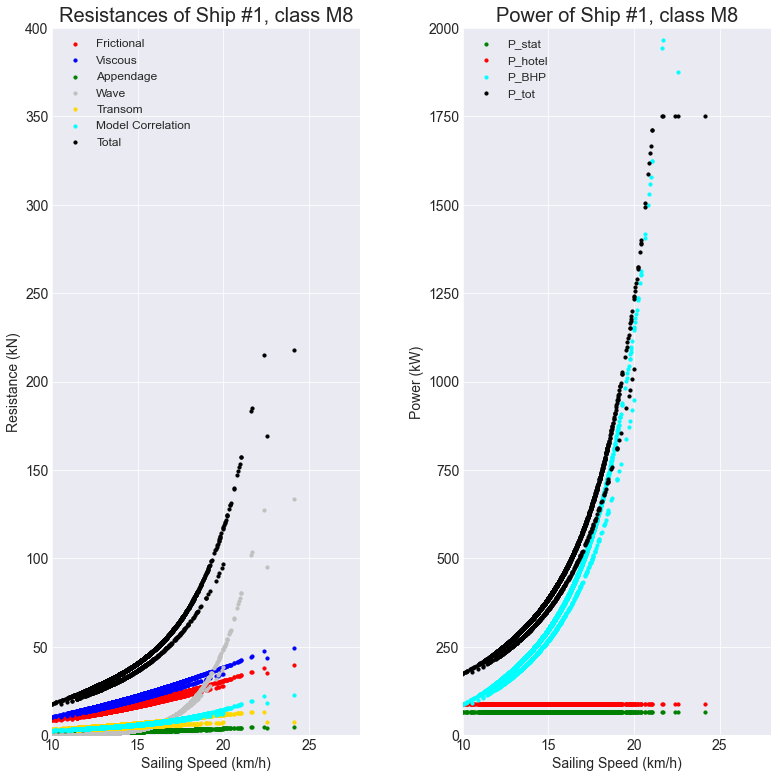

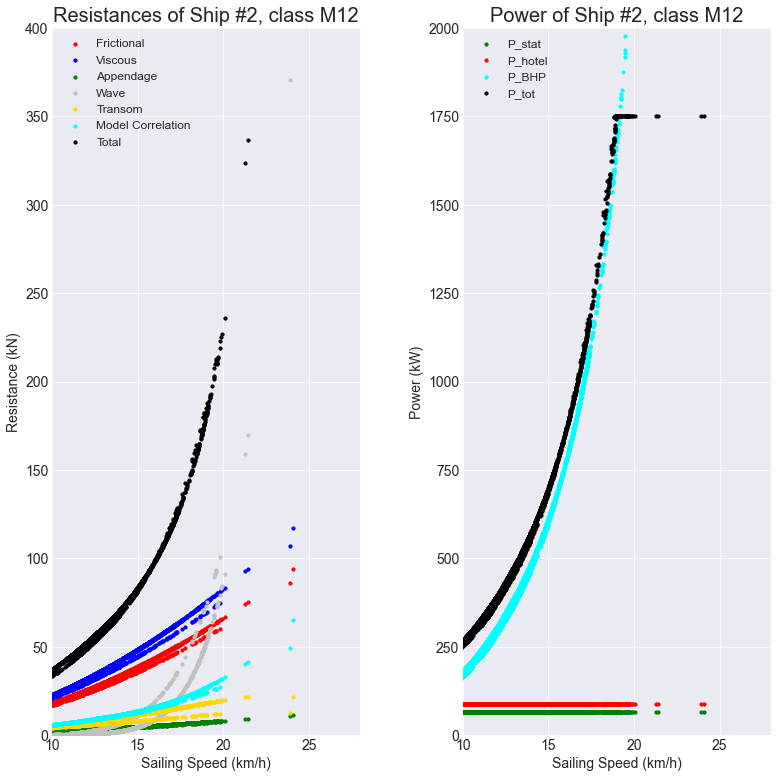

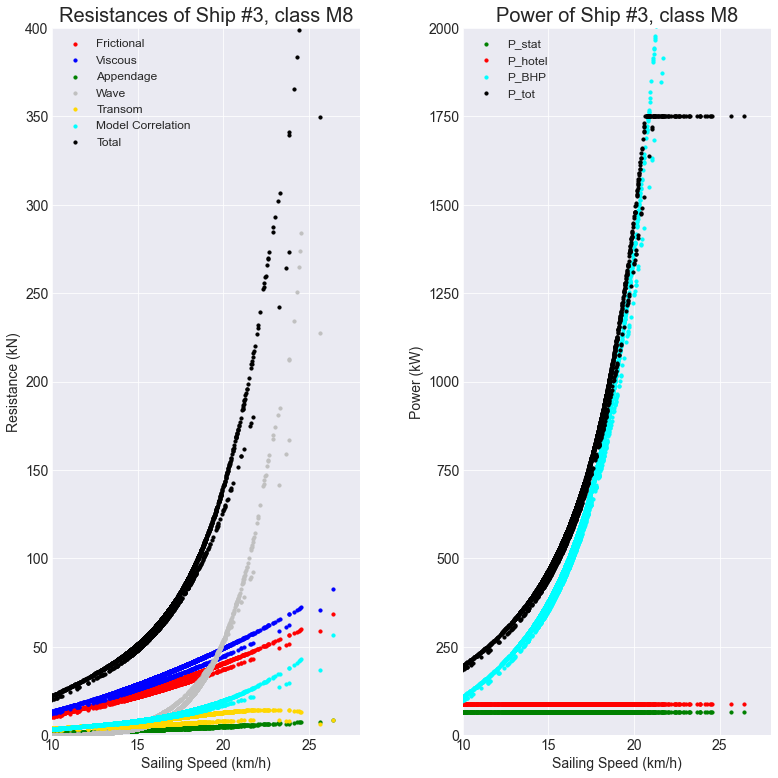

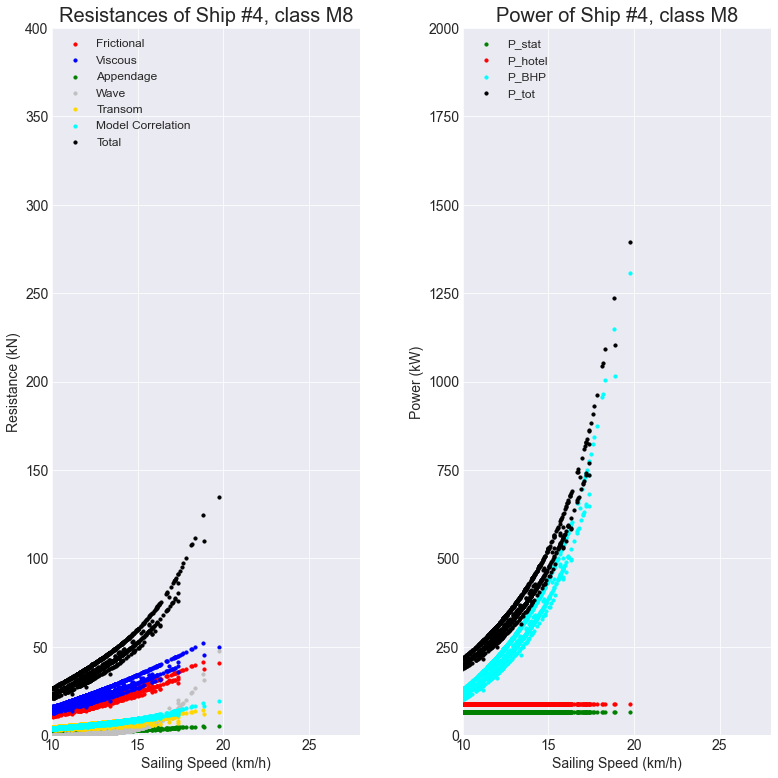

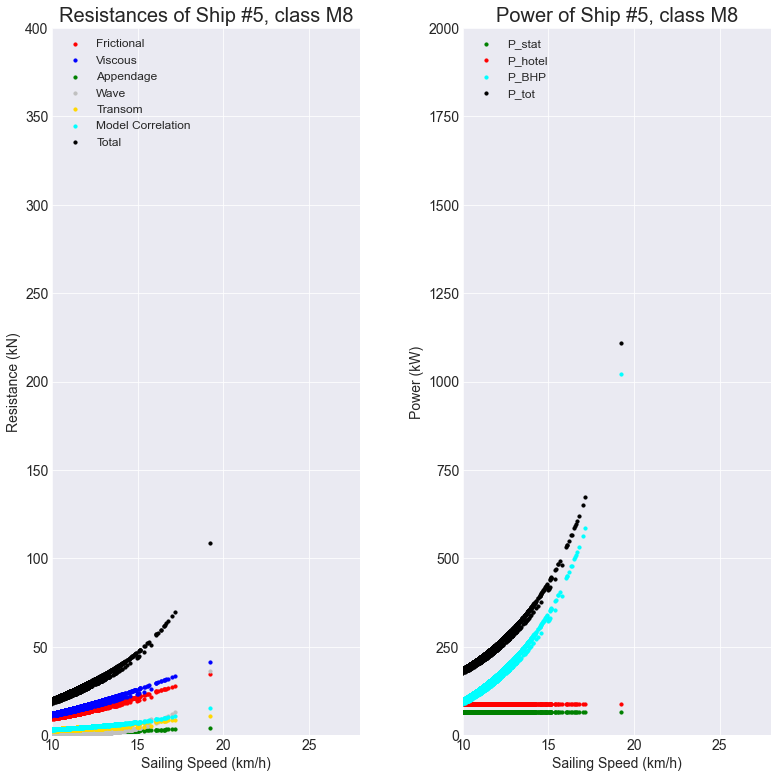

...

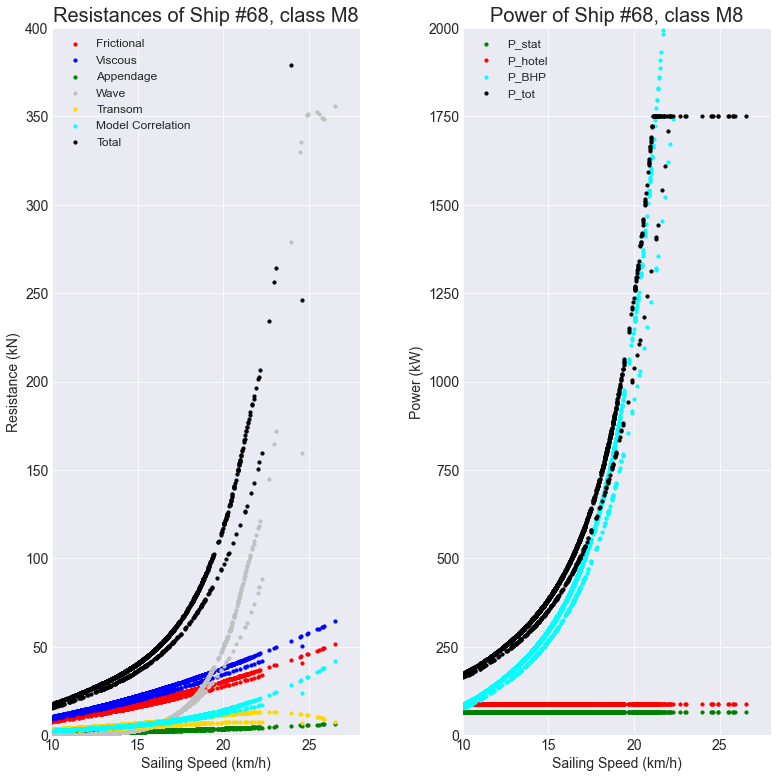

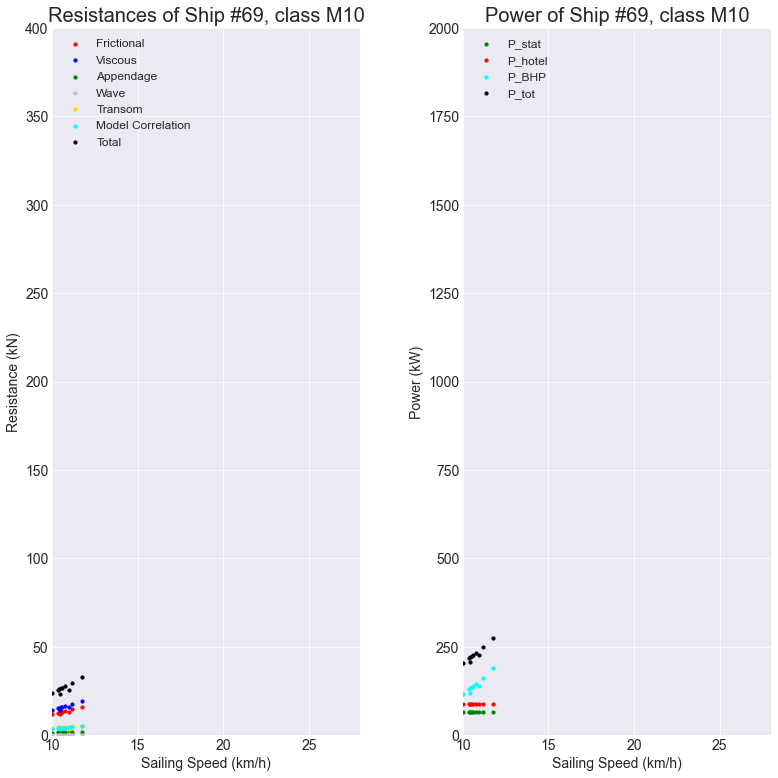

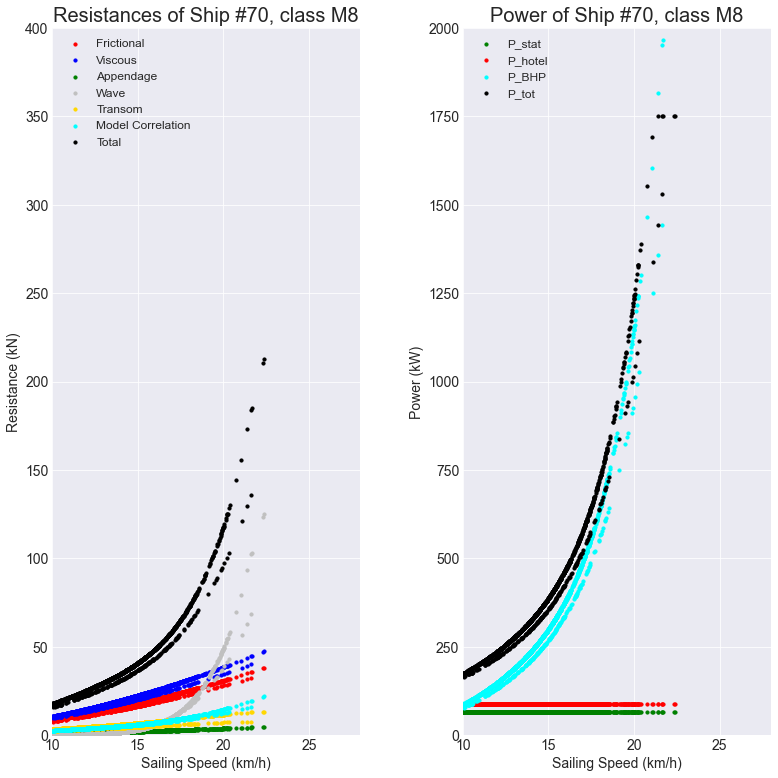

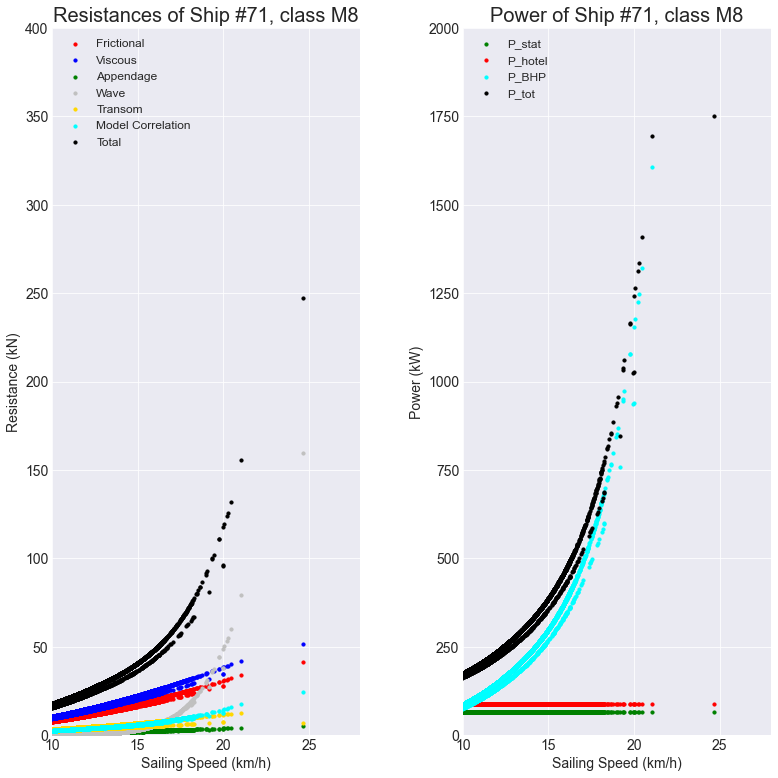

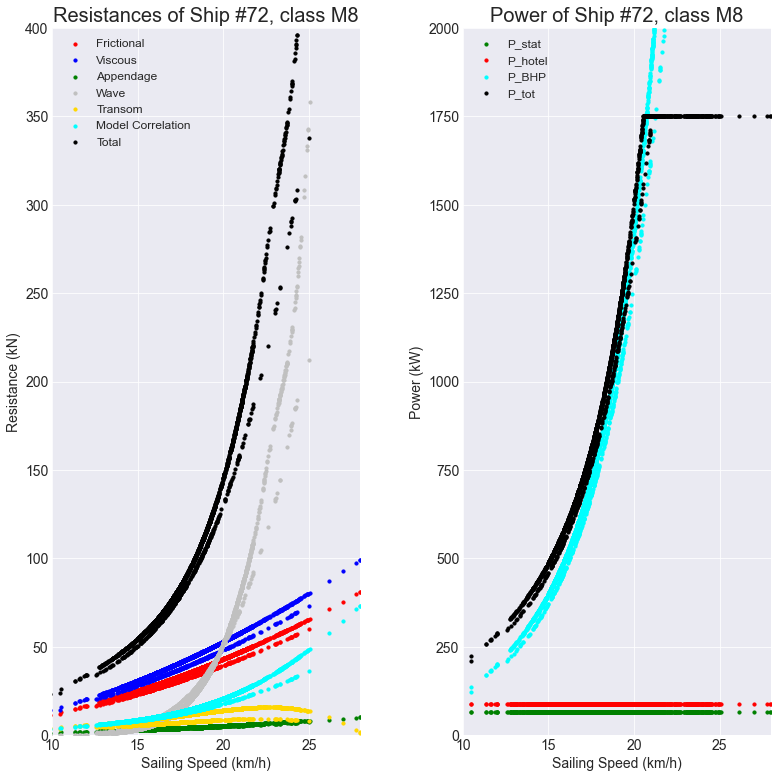

In [232]:
# Note: there are still velocities >>> 20 km/h, these can't be real and need to be filtered out. Put Filter at 30 
for i in range(len(traj_collection.trajectories)):
    ship_number = i
    df_ship_xx = traj_collection.trajectories[ship_number].df
    ship_class = df_ship_xx['RWS classification'][0]

    mcog = np.mean(df_ship_xx.cog)
    print(f"The mean sailing direction of ship #{ship_number + 1} is {mcog} degrees.")
    if mcog > 180:
        print(f"Ship #{ship_number + 1} is sailing downstream and the velocity must be corrected downwards in the calculations.")
    else:
        print(f"Ship #{ship_number + 1} is sailing upstream and the velocity must be corrected upwards in the calculations.")

    # Input Values
    sailing_speed = df_ship_xx.speedcalculated * 3.6
    resistance_values_1 = df_ship_xx['R_F']
    resistance_values_2 = df_ship_xx['(1+k1)R_F']
    resistance_values_3 = df_ship_xx['R_APP']
    resistance_values_4 = df_ship_xx['R_W']
    resistance_values_5 = df_ship_xx['R_TR']
    resistance_values_6 = df_ship_xx['R_A']
    resistance_values_7 = df_ship_xx['R_tot']
    power_values_1 = df_ship_xx['P_stat']
    power_values_2 = df_ship_xx['P_hotel']
    power_values_3 = df_ship_xx['P_BHP']
    power_values_4 = df_ship_xx['P_tot']

    # Graph Details
    fig, axs = plt.subplots(1, 2, figsize=(12, 12))
    axs[0].scatter(sailing_speed, resistance_values_1, s=10, c='red', label='Frictional')
    axs[0].scatter(sailing_speed, resistance_values_2, s=10, c='blue', label='Viscous')
    axs[0].scatter(sailing_speed, resistance_values_3, s=10, c='green', label='Appendage')
    axs[0].scatter(sailing_speed, resistance_values_4, s=10, c='silver', label='Wave')
    axs[0].scatter(sailing_speed, resistance_values_5, s=10, c='gold', label='Transom')
    axs[0].scatter(sailing_speed, resistance_values_6, s=10, c='cyan', label='Model Correlation')
    axs[0].scatter(sailing_speed, resistance_values_7, s=10, c='black', label='Total')
    
    axs[1].scatter(sailing_speed, power_values_1, s=10, c='green', label='P_stat')
    axs[1].scatter(sailing_speed, power_values_2, s=10, c='red', label='P_hotel')
    axs[1].scatter(sailing_speed, power_values_3, s=10, c='cyan', label='P_BHP')
    axs[1].scatter(sailing_speed, power_values_4, s=10, c='black', label='P_tot')

    # Set chart style
    plt.style.use('seaborn-darkgrid')

    # Set chart title and label axes.
    axs[0].set_title(f"Resistances of Ship #{ship_number + 1}, class {ship_class}", fontsize=20)
    axs[0].set_xlabel("Sailing Speed (km/h)", fontsize=14)
    axs[0].set_ylabel("Resistance (kN)", fontsize=14)
    
    axs[1].set_title(f"Power of Ship #{ship_number + 1}, class {ship_class}", fontsize=20)
    axs[1].set_xlabel("Sailing Speed (km/h)", fontsize=14)
    axs[1].set_ylabel("Power (kW)", fontsize=14)

    # Set size of tick labels
    axs[0].tick_params(axis='both', which='major', labelsize=14)
    axs[1].tick_params(axis='both', which='major', labelsize=14)

    # Set the range for each axis
    axs[0].axis([10, 28, 0, 400])
    # Limit power at 2000 kW, since P_installed is also limited
    axs[1].axis([10, 28, 0, 2000])
    
    # Set the legend and it's location
    axs[0].legend(loc='upper left', fontsize=12)
    axs[1].legend(loc='upper left', fontsize=12)
    
    fig.tight_layout(pad=5.0)

# plt.savefig('squares_plot.png', bbox_inches='tight')

#### 6.4.1 Image for Validation M9 Ship
![title](robert_hekkenberg_power_calculations.png)

##### For now it appears the calculations result in a bit of a lower Power than in the validation data, but the results are of the same order of magnitude. This is however, still without the accounting of the flow velocity.

### 6.5 Fuel Consumption calculations

#### 6.5.1 Compute the delta t of each timestep

In [233]:
# We create a column with the current time step, and create an empty column for the next timestep.
# With this information, we can compute the delta t later on.

def calc_delta_t(df):
    """Calculates the timestep between each point."""
    # The column for the next timestamp is a copy of the next row newtimestamp shifted upwards.
    df['newtimestamp'] = df.index
    df['next_timestamp'] = df['newtimestamp'].shift(-1)
    
    # The timestamps needs to be changed so they can be substracted.
    df["newtimestamp"] = pd.to_datetime(df["newtimestamp"])
    df["next_timestamp"] = pd.to_datetime(df["next_timestamp"])
    
    # You need the delta_t to calculate the energy consumption during that timestep
    t1 = df.newtimestamp
    t2 = df.next_timestamp
    delta_t = t2 - t1
    
    # Change delta_t to seconds
    seconds = delta_t.dt.total_seconds()
    df['seconds'] = seconds
    
    return df

#### 6.5.2 Compute the delta energy per time step

In [234]:
def calc_delta_e(df):
    """Calculates the delta energy between each point."""
    # The energy can be calculated by multiplying the total power [kW] with the delta_t [hours]
    P_tot = df['P_tot']
    seconds = df['seconds']
    # delta_energy in kWh
    delta_energy = P_tot * seconds / 3600
    df['delta_energy'] = delta_energy
    
    return df

#### 6.5.3 Input for Fuel Tank and Power Train Efficiencies

In [ ]:
def energy_carrier_input(df):
    """Adds the required information for the energy carrier consumption calculation"""
    # Provides energy carrier information as input for consumption calculations
    # Gross energy density from MJ/L to kWh/L. Density includes engine room space.
    # Efficiency (average) is product of serie efficiencies in the fuel process,
    #  energy conversion, pre-treatment, after_treatment, power system, source MARIN

    # Diesel
    df['diesel_eff'] = 0.331
    df['diesel_dens'] = 8.611

    # # Compressed Natural Gas
    # df['CNG_eff'] = np.nan
    # df['CNG_dens'] = 2.361

    # # Liquid Natural Gas
    # df['LNG_eff'] = np.nan
    # df['LNG_dens'] = 4.167

    # Methanol ICE
    df['methanolICE_eff'] = 0.342
    df['methanolICE_dens'] = 3.889

    # Methanol Fuel Cell
    df['methanolFC_eff'] = 0.384
    df['methanolFC_dens'] = 3.889

    # # Methylether
    # df['methylether_eff'] = np.nan
    # df['methylether_dens'] = 3.75

    # Ammonia
    df['ammonia_eff'] = 0.315
    df['ammonia_dens'] = 2.667

    # Hydrogen Compressed
    df['H2C_eff'] = 0.411
    df['H2C_dens'] = 1.056

    # Hydrogen Liquid
    df['H2L_eff'] = 0.411
    df['H2L_dens'] = 1.389

    # # Liquid Organic Hydrogen Carrier
    # df['LOHC_eff'] = np.nan
    # df['LOHC_dens'] = 1.528

    # # Natriumborohydride
    # df['NABH_eff'] = np.nan
    # df['NABH_dens'] = 4.25

    # Lithium Nickel Mangaan Cobalt Battery
    df['LNMC_eff'] = 0.912
    df['LNMC_dens'] = 0.111
    
    return df

#### 6.5.4 Calculate fuel consumption

In [236]:
def calc_ec_consumption(df):
    """Calculating the fuel consumption (L) of each time step = energy [kWh] / engine_efficiency [-] / density [kWh / L]"""
    df['Diesel_cons'] = df['delta_energy'] / df['diesel_eff'] / df['diesel_dens']
    df['MethICE_cons'] = df['delta_energy'] / df['methanolICE_eff'] / df['methanolICE_dens']
    df['MethFC_cons'] = df['delta_energy'] / df['methanolFC_eff'] / df['methanolFC_dens']
    df['Ammonia_cons'] = df['delta_energy'] / df['ammonia_eff'] / df['ammonia_dens']
    df['H2C_cons'] = df['delta_energy'] / df['H2C_eff'] / df['H2C_dens']
    df['H2L_cons'] = df['delta_energy'] / df['H2L_eff'] / df['H2L_dens']
    df['LNMC_cons'] = df['delta_energy'] / df['LNMC_eff'] / df['LNMC_dens']
    
    return df

In [237]:
def calc_ec_cons_km(df):
    """Calculates the fuel consumption per km (L / km) of each time step."""
    # s = v * t ; the distance is the velocity (in m/s) muliplied by the time (in seconds)
    df['distance'] = df['speedcalculated'] * df['seconds'] 

    def distance_not_zero(row):
        if row['distance'] < 0.25:
            return 0.25
        else:
            return row['distance']
        
    df['distance'] = df.apply(distance_not_zero, axis = 1)

    # The consumption in L / km is:
    #  Diesel
    df['Diesel_L_km'] = df['Diesel_cons'] / df['distance'] * 1000
    
    #  Methanol Internal Combustion Engine
    df['MethICE_L_km'] = df['MethICE_cons'] / df['distance'] * 1000
    
    #  Methanol Fuel Cell
    df['MethFC_L_km'] = df['MethFC_cons'] / df['distance'] * 1000
    
    #  Ammonia
    df['Ammonia_L_km'] = df['Ammonia_cons'] / df['distance'] * 1000
    
    #  Hydrogen Compressed
    df['H2C_L_km'] = df['H2C_cons'] / df['distance'] * 1000
    
    #  Hydrogen Liquid
    df['H2L_L_km'] = df['H2L_cons'] / df['distance'] * 1000
    
    #  LNMC Battery
    df['LNMC_L_km'] = df['LNMC_cons'] / df['distance'] * 1000
    
    return df

In [238]:
def calc_ec_cons_h(df):
    """Calculates the fuel consumption per hour (L / h) of each time step."""
    # Diesel
    df['Diesel_L_h'] = df['Diesel_cons'] / (df['seconds'] / 3600)

    #  Methanol Internal Combustion Engine
    df['MethICE_L_km'] = df['MethICE_cons'] / (df['seconds'] / 3600)
    
    #  Methanol Fuel Cell
    df['MethFC_L_km'] = df['MethFC_cons'] / (df['seconds'] / 3600)
    
    #  Ammonia
    df['Ammonia_L_km'] = df['Ammonia_cons'] / (df['seconds'] / 3600)
    
    #  Hydrogen Compressed
    df['H2C_L_km'] = df['H2C_cons'] / (df['seconds'] / 3600)
    
    #  Hydrogen Liquid
    df['H2L_L_km'] = df['H2L_cons'] / (df['seconds'] / 3600)
    
    #  LNMC Battery
    df['LNMC_L_km'] = df['LNMC_cons'] / (df['seconds'] / 3600)
    
    return df

#### 6.5.5 Calculate Tank Volume

In [268]:
def calc_bunker_volume(df):
    """
    Calculates the leftover volume of energy carries in the bunker tank in L. 
    First calculates the cumulative consumption during each time step. Also tracks the amount of tanks emptied.
    """
    # Diesel
    df.loc[:,'cum_cons_diesel'] = df['Diesel_cons'].cumsum()
    df.loc[:,'nr_tanks_diesel'] = df['cum_cons_diesel'] // df['V_tank']
    df.loc[:,'V_left_Diesel'] = df['V_tank'] - df['cum_cons_diesel'] % df['V_tank']
    
    # Methanol ICE
    df.loc[:,'cum_cons_MethICE'] = df['MethICE_cons'].cumsum()
    df.loc[:,'nr_tanks_MethICE'] = df['cum_cons_MethICE'] // df['V_tank']
    df.loc[:,'V_left_MethICE'] = df['V_tank'] - df['cum_cons_MethICE'] % df['V_tank']
    
    # Methanol FC
    df.loc[:,'cum_cons_MethFC'] = df['MethFC_cons'].cumsum()
    df.loc[:,'nr_tanks_MethFC'] = df['cum_cons_MethFC'] // df['V_tank']
    df.loc[:,'V_left_MethFC'] = df['V_tank'] - df['cum_cons_MethFC'] % df['V_tank']
    
    # Ammonia
    df.loc[:,'cum_cons_Ammonia'] = df['Ammonia_cons'].cumsum()
    df.loc[:,'nr_tanks_Ammonia'] = df['cum_cons_Ammonia'] // df['V_tank']
    df.loc[:,'V_left_Ammonia'] = df['V_tank'] - df['cum_cons_Ammonia'] % df['V_tank']
    
    # H2C
    df.loc[:,'cum_cons_H2C'] = df['H2C_cons'].cumsum()
    df.loc[:,'nr_tanks_H2C'] = df['cum_cons_H2C'] // df['V_tank']
    df.loc[:,'V_left_H2C'] = df['V_tank'] - df['cum_cons_H2C'] % df['V_tank']
    
    # H2L
    df.loc[:,'cum_cons_H2L'] = df['H2L_cons'].cumsum()
    df.loc[:,'nr_tanks_H2L'] = df['cum_cons_H2L'] // df['V_tank']
    df.loc[:,'V_left_H2L'] = df['V_tank'] - df['cum_cons_H2L'] % df['V_tank']
        
    # LNMC Battery
    df.loc[:,'cum_cons_LNMC'] = df['LNMC_cons'].cumsum()
    df.loc[:,'nr_tanks_LNMC'] = df['cum_cons_LNMC'] // df['V_tank']
    df.loc[:,'V_left_LNMC'] = df['V_tank'] - df['cum_cons_LNMC'] % df['V_tank']
    
    return df

#### 6.5.6 Calculate Sailed Distance

In [269]:
def calc_sailed_distance(df):
    """
    Calculates the cumulative sailed distance per time step in km.
    """
    df.loc[:,'cum_sailed_distance'] = (df['distance'].cumsum()) / 1000
    
    return df

#### 6.5.7 Apply Fuel Consumption Calculation

In [270]:
itraj = 1

for tr_ship in traj_collection.trajectories:
    df_ship = tr_ship.df

    df_ship = calc_delta_t(df_ship)
    df_ship = calc_delta_e(df_ship)
    df_ship = energy_carrier_input(df_ship)
    df_ship = calc_ec_consumption(df_ship)
    df_ship = calc_ec_cons_km(df_ship)
    df_ship = calc_ec_cons_h(df_ship)
    df_ship = calc_bunker_volume(df_ship)
    df_ship = calc_sailed_distance(df_ship)
    
    tr_ship.df = df_ship
    print('trajectory {} of {}'.format(itraj, len(traj_collection.trajectories)))
    itraj += 1

trajectory 1 of 72
trajectory 2 of 72
trajectory 3 of 72
trajectory 4 of 72
trajectory 5 of 72
trajectory 6 of 72
trajectory 7 of 72
trajectory 8 of 72
trajectory 9 of 72
trajectory 10 of 72
trajectory 11 of 72
trajectory 12 of 72
trajectory 13 of 72
trajectory 14 of 72
trajectory 15 of 72
trajectory 16 of 72
trajectory 17 of 72
trajectory 18 of 72
trajectory 19 of 72
trajectory 20 of 72
trajectory 21 of 72
trajectory 22 of 72
trajectory 23 of 72
trajectory 24 of 72
trajectory 25 of 72
trajectory 26 of 72
trajectory 27 of 72
trajectory 28 of 72
trajectory 29 of 72
trajectory 30 of 72
trajectory 31 of 72
trajectory 32 of 72
trajectory 33 of 72
trajectory 34 of 72
trajectory 35 of 72
trajectory 36 of 72
trajectory 37 of 72
trajectory 38 of 72
trajectory 39 of 72
trajectory 40 of 72
trajectory 41 of 72
trajectory 42 of 72
trajectory 43 of 72
trajectory 44 of 72
trajectory 45 of 72
trajectory 46 of 72
trajectory 47 of 72
trajectory 48 of 72
trajectory 49 of 72
trajectory 50 of 72
trajector

In [293]:
pd.set_option("max_rows", None)
df_day_o = traj_collection.trajectories[0].df
df_day = df_day_o.head(-1).copy()
df_day

,latitude,longitude,shipname,vesseltypeERI,sog,cog,length,width,draughtInland,vesseltype,...,nr_tanks_H2C,V_left_H2C,cum_cons_H2L,nr_tanks_H2L,V_left_H2L,cum_cons_LNMC,nr_tanks_LNMC,V_left_LNMC,cum_sailed_distance,V_left_Diesel
timestamplast,,,,,,,,,,,,,,,,,,,,,
2019-08-01 00:24:38+00:00,51.877789,4.310908,testschip-1060,8020,0.7,298.600006,86.0,10.0,2.225,89,...,0.0,57999.297149,0.534349,0.0,57999.465651,3.013360,0.0,57996.986640,0.011913,57999.892974
2019-08-01 00:24:50+00:00,51.877682,4.310920,testschip-1060,8020,0.9,241.699997,86.0,10.0,2.225,89,...,0.0,57998.782593,0.925545,0.0,57999.074455,5.219437,0.0,57994.780563,0.018713,57999.814621
2019-08-01 00:24:59+00:00,51.877621,4.310925,testschip-1060,8020,1.2,216.399994,86.0,10.0,2.905,89,...,0.0,57998.261858,1.321439,0.0,57998.678561,7.452007,0.0,57992.547993,0.026356,57999.735327
2019-08-01 00:25:08+00:00,51.877552,4.310922,testschip-1060,8020,1.4,200.300003,86.0,10.0,2.225,89,...,0.0,57997.630075,1.801757,0.0,57998.198243,10.160674,0.0,57989.839326,0.035271,57999.639123
2019-08-01 00:25:19+00:00,51.877472,4.310925,testschip-1060,8020,1.6,189.600006,86.0,10.0,2.905,89,...,0.0,57997.051321,2.241760,0.0,57997.758240,12.641988,0.0,57987.358012,0.043788,57999.550995
2019-08-01 00:25:29+00:00,51.877396,4.310935,testschip-1060,8020,2.1,171.399994,86.0,10.0,2.905,89,...,0.0,57996.494882,2.664798,0.0,57997.335202,15.027632,0.0,57984.972368,0.057342,57999.466264
2019-08-01 00:25:37+00:00,51.877277,4.310982,testschip-1060,8020,2.9,164.600006,86.0,10.0,2.905,89,...,0.0,57995.684492,3.280905,0.0,57996.719095,18.502051,0.0,57981.497949,0.076559,57999.342863
2019-08-01 00:25:49+00:00,51.877110,4.311048,testschip-1060,8020,3.7,166.199997,86.0,10.0,2.905,89,...,0.0,57994.942801,3.844782,0.0,57996.155218,21.681933,0.0,57978.318067,0.095746,57999.229923
2019-08-01 00:25:57+00:00,51.876942,4.311112,testschip-1060,8020,4.2,167.100006,86.0,10.0,2.905,89,...,0.0,57994.053999,4.520502,0.0,57995.479498,25.492529,0.0,57974.507471,0.118824,57999.094582


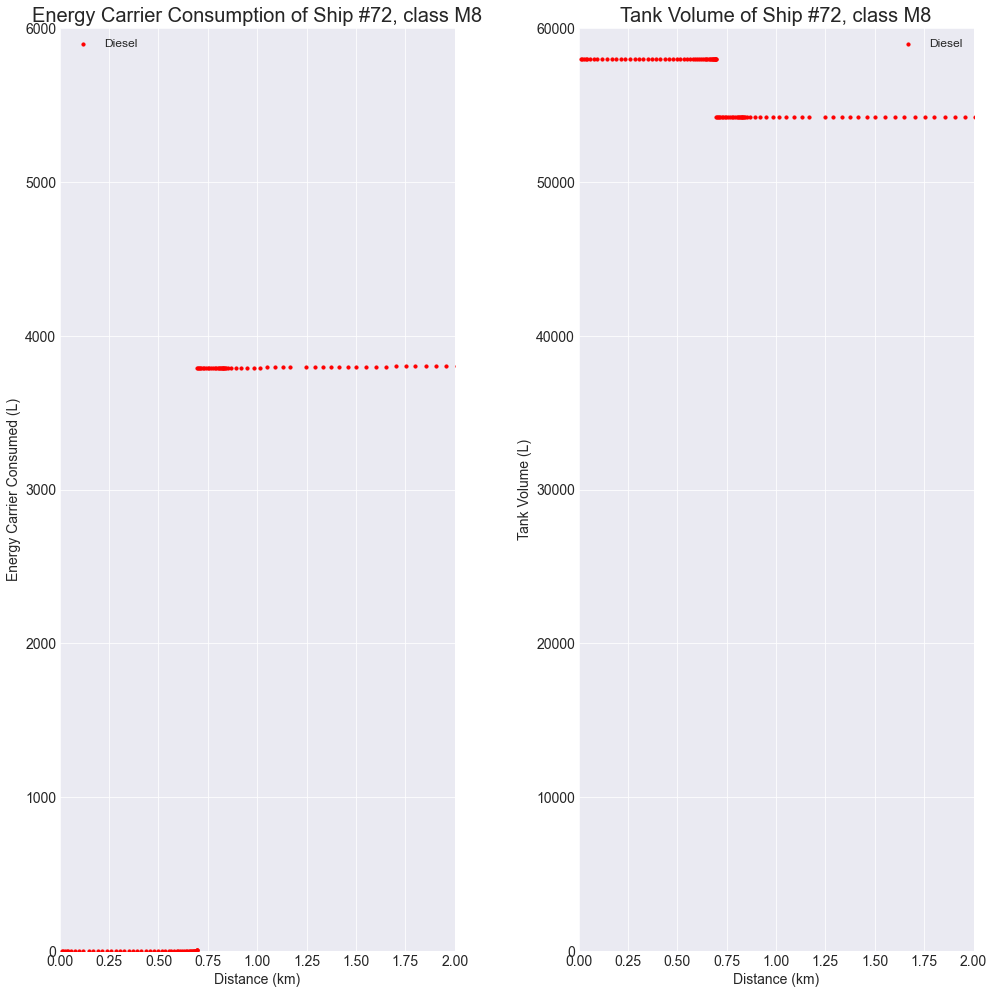

In [300]:
ship_class = df_day['RWS classification'][0]

# Input Values
#  Distance in km
distance = df_day['cum_sailed_distance']

# Cumulative consumption
consumption_values_1 = df_day['cum_cons_diesel']
# consumption_values_2 = df_day['cum_cons_MethICE']
# consumption_values_3 = df_day['cum_cons_MethFC']
# consumption_values_4 = df_day['cum_cons_Ammonia']
# consumption_values_5 = df_day['cum_cons_H2C']
# consumption_values_6 = df_day['cum_cons_H2L']
# onsumption_values_7 = df_day['cum_cons_LNMC']

# Tank energy carrier levels
tank_values_1 = df_day['V_left_Diesel']
# tank_values_2 = df_day['V_left_MethICE']
# tank_values_3 = df_day['V_left_MethFC']
# tank_values_4 = df_day['V_left_Ammonia']
# tank_values_5 = df_day['V_left_H2C']
# tank_values_6 = df_day['V_left_H2L']
# tank_values_7 = df_day['V_left_LNMC']

# Graph Details
fig, axs = plt.subplots(1, 2, figsize=(15, 15))

axs[0].scatter(distance, consumption_values_1, s=10, c='red', label='Diesel')
# axs[0].scatter(distance, consumption_values_2, s=10, c='blue', label='Methanol ICE')
# axs[0].scatter(distance, consumption_values_3, s=10, c='green', label='Methanol FC')
# axs[0].scatter(distance, consumption_values_4, s=10, c='silver', label='Ammonia')
# axs[0].scatter(distance, consumption_values_5, s=10, c='gold', label='H2C')
# axs[0].scatter(distance, consumption_values_6, s=10, c='cyan', label='H2L')
# axs[0].scatter(distance, consumption_values_7, s=10, c='black', label='LNMC')

axs[1].scatter(distance, tank_values_1, s=10, c='red', label='Diesel')
# axs[1].scatter(distance, tank_values_2, s=10, c='blue', label='Methanol ICE')
# axs[1].scatter(distance, tank_values_3, s=10, c='green', label='Methanol FC')
# axs[1].scatter(distance, tank_values_4, s=10, c='silver', label='Ammonia')
# axs[1].scatter(distance, tank_values_5, s=10, c='gold', label='H2C')
# axs[1].scatter(distance, tank_values_6, s=10, c='cyan', label='H2L')
# axs[1].scatter(distance, tank_values_7, s=10, c='black', label='LNMC')

# Set chart style
plt.style.use('seaborn-darkgrid')

# Set chart title and label axes.
axs[0].set_title(f"Energy Carrier Consumption of Ship #{ship_number + 1}, class {ship_class}", fontsize=20)
axs[0].set_xlabel("Distance (km)", fontsize=14)
axs[0].set_ylabel("Energy Carrier Consumed (L)", fontsize=14)

axs[1].set_title(f"Tank Volume of Ship #{ship_number + 1}, class {ship_class}", fontsize=20)
axs[1].set_xlabel("Distance (km)", fontsize=14)
axs[1].set_ylabel("Tank Volume (L)", fontsize=14)

# Set size of tick labels
axs[0].tick_params(axis='both', which='major', labelsize=14)
axs[1].tick_params(axis='both', which='major', labelsize=14)

# Set the range for each axis
axs[0].axis([0, 2, 0, 6000])
# Limit power at 2000 kW, since P_installed is also limited
axs[1].axis([0, 2, 0, 60000])

# Set the legend and it's location
axs[0].legend(loc='upper left', fontsize=12)
axs[1].legend(loc='upper right', fontsize=12)

fig.tight_layout(pad=5.0)

## 7. Totals

In [245]:
# Diesel
fuel_sum = df_day['Diesel_cons'].sum()
fuel_mean = df_day['Diesel_L_h'].mean()
power_mean = df_day['P_tot'].mean()
      
print(f"The total diesel consumption of class {df_day['RWS classification'][0]} {df_day['shipname'][0]} is", round(fuel_sum), 'L')
print(f"The average diesel consumption of {df_day['shipname'][0]} is", round(fuel_mean), 'L/h')
print('The the average power required is', round(power_mean), 'kW')

The total diesel consumption of class M8 testschip-1060 is 5156 L
The average diesel consumption of testschip-1060 is 135 L/h
The the average power required is 386 kW


In [246]:
total_distance = df_day['distance'].sum()
print('The total sailed distance is', round(total_distance / 1000, 2), 'km')

total_time = df_day['seconds'].sum()
print('The total time sailed is', round(total_time / 3600, 2), 'hr')

The total sailed distance is 146.2 km
The total time sailed is 16.39 hr


In [137]:
58000 / 135 / 24

17.901234567901234

## 8. Fuel Consumption Plots

In [244]:
# Different color sets to make a datashader plot
from colorcet import bmy
from colorcet import kgy
from colorcet import coolwarm
from colorcet import CET_L18
from colorcet import CET_L19
from colorcet import CET_D13

### 8.1 Diesel

In [245]:
%%time
# Change projection to EPSG:3857
df_proj_diesel = df_fcs.to_crs("EPSG:3857").copy()

Wall time: 178 ms


In [246]:
%%time

currdate = df_proj_diesel.index[0]

# Create a df of 1 day
upbound = pd.to_datetime(currdate.date(), utc=True) + datetime.timedelta(days=1) # first date, current date + 1 day
lowbound = pd.to_datetime(currdate.date(), utc=True) - datetime.timedelta(days=1) # current date - 1 day
df_proj_diesel = df_proj_diesel[(df_proj_diesel.index>lowbound) & (df_proj_diesel.index<upbound)].copy()
df_proj_diesel['x'] = df_proj_diesel.geometry.x
df_proj_diesel['y'] = df_proj_diesel.geometry.y

Wall time: 82 ms


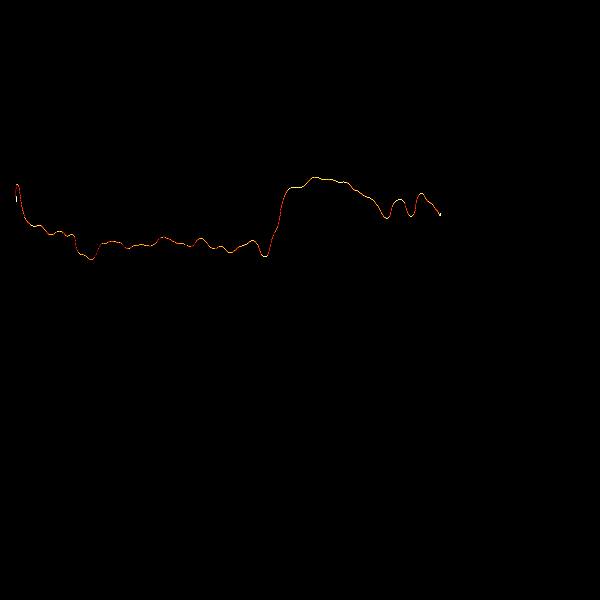

In [251]:
agg = ds.Canvas(x_range=xrange, y_range=yrange).points(df_proj_diesel, 'x', 'y')
tf.set_background(tf.shade(agg, cmap=fire), "black") # None = transparant background

In [248]:
df_proj_diesel

,latitude,longitude,geometry,shipname,draughtInland,RWS classification,speedcalculated,P_tot,L_w,V_tank,...,MethFC_cons,Ammonia_cons,H2C_cons,H2L_cons,LNMC_cons,distance,Diesel_L_km,Diesel_L_h,x,y
timestamplast,,,,,,,,,,,,,,,,,,,,,
2019-08-01 00:24:38+00:00,51.877789,4.310908,POINT (479888.066 6778058.148),testschip-1060,2.225,M8,0.992726,91.514550,3,58000,...,0.030120,0.036029,0.118726,0.090263,2.506344,11.912707,0.984312,3.517747,479888.065687,6.778058e+06
2019-08-01 00:24:50+00:00,51.877682,4.310920,POINT (479889.393 6778038.888),testschip-1060,2.225,M8,0.755631,89.330215,3,58000,...,0.022051,0.026377,0.086919,0.066081,1.834891,6.800678,1.262294,3.433782,479889.392718,6.778039e+06
2019-08-01 00:24:59+00:00,51.877621,4.310925,POINT (479889.977 6778027.882),testschip-1060,2.905,M8,0.849167,90.402998,3,58000,...,0.022316,0.026694,0.087963,0.066875,1.856926,7.642503,1.136741,3.475019,479889.976612,6.778028e+06
2019-08-01 00:25:08+00:00,51.877552,4.310922,POINT (479889.658 6778015.501),testschip-1060,2.905,M8,0.810497,90.038196,3,58000,...,0.027165,0.032494,0.107077,0.081406,2.260418,8.915467,1.186171,3.460997,479889.658125,6.778016e+06
2019-08-01 00:25:19+00:00,51.877472,4.310925,POINT (479889.977 6778001.055),testschip-1060,2.905,M8,0.851681,90.427830,3,58000,...,0.024802,0.029668,0.097764,0.074326,2.063818,8.516811,1.133697,3.475974,479889.976612,6.778001e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-08-01 16:47:28+00:00,51.857071,6.090568,POINT (677998.936 6774323.188),testschip-1060,2.905,M8,0.403926,87.841261,3,58000,...,0.026502,0.031701,0.104464,0.079420,2.205264,4.443181,2.322037,3.376548,677998.935709,6.774323e+06
2019-08-01 16:47:39+00:00,51.857109,6.090587,POINT (678001.059 6774330.063),testschip-1060,2.905,M8,0.307534,87.655670,3,58000,...,0.021638,0.025883,0.085290,0.064842,1.800495,2.767804,3.043401,3.369414,678001.058960,6.774330e+06
2019-08-01 16:47:48+00:00,51.857132,6.090603,POINT (678002.811 6774334.189),testschip-1060,2.905,M8,0.275510,87.613450,3,58000,...,0.024030,0.028745,0.094721,0.072012,1.999586,2.755101,3.395511,3.367791,678002.810642,6.774334e+06


In [138]:
cnvs = ds.Canvas(x_range=xrange, y_range=yrange)
agg = cnvs.points(df_proj_diesel, 'x', 'y', agg = ds.mean('Diesel_L_km'))

tf.set_background(tf.shade(agg, cmap=CET_L18), "None")

NameError: name 'df_proj_diesel' is not defined

### 6.2 PM10 emissions

In [ ]:
cnvs = ds.Canvas(x_range=xrange, y_range=yrange)
agg = cnvs.points(df_ems, 'x', 'y', agg = ds.mean('PM10_g_m'))

tf.set_background(tf.shade(agg, cmap=CET_D13), None)

### 6.3 NOx emissions

In [ ]:
cnvs = ds.Canvas(x_range=xrange, y_range=yrange)
agg = cnvs.points(df_ems, 'x', 'y', agg = ds.mean('NOX_g_m'))

tf.set_background(tf.shade(agg, cmap=CET_L19),None)

# 7. Acceleration on batteries

#### 7.1 Make a copy

In [ ]:
#Make a copy of df_ems to apply the policy of acceleration on batteries

df_hybrid = df_ems.copy()

In [ ]:
#Test how much datapoints have an acceleration of 0.05 m/s^3 or higher

df_hybrid_test = df_hybrid[df_hybrid['acceleration'] > 0.05]

In [ ]:
len(df_hybrid_test)

In [ ]:
len(df_hybrid)

In [ ]:
len(df_hybrid_test) / len(df_hybrid)

#### 7.2 Set emission and fuel consumption to zero in case of acceleration > 0.05 m/s^2

In [ ]:
def hybrid_CO2(row):
    if row['acceleration'] > 0.05:
        return 0
    else:
        return row['CO2_ems']

In [ ]:
df_hybrid['CO2_ems'] = df_hybrid.apply(hybrid_CO2, axis = 1)

In [ ]:
def hybrid_PM10(row):
    if row['acceleration'] > 0.05:
        return 0
    else:
        return row['PM10_ems']

In [ ]:
df_hybrid['PM10_ems'] = df_hybrid.apply(hybrid_PM10, axis = 1)

In [ ]:
def hybrid_NOX(row):
    if row['acceleration'] > 0.05:
        return 0
    else:
        return row['NOX_ems']

In [ ]:
df_hybrid['NOX_ems'] = df_hybrid.apply(hybrid_NOX, axis = 1)

In [ ]:
def hybrid_fuel(row):
    if row['acceleration'] > 0.05:
        return 0
    else:
        return row['delta_fuel']

In [ ]:
df_hybrid['delta_fuel'] = df_hybrid.apply(hybrid_fuel, axis = 1)

In [ ]:
df_hybrid['fuel_L_h'] = df_hybrid['delta_fuel'] / (df_hybrid['seconds'] / 3600)

#### 7.3 Calculate totals

In [ ]:
fuel_sum_hybrid = df_hybrid['delta_fuel'].sum()
fuel_mean_hybrid = df_hybrid['fuel_L_h'].mean()
power_mean_hybrid = df_hybrid['P_tot'].mean()
CO2_sum_hybrid = df_hybrid['CO2_ems'].sum()
PM10_sum_hybrid = df_hybrid['PM10_ems'].sum()
NOX_sum_hybrid = df_hybrid['NOX_ems'].sum()
      
print('The total fuel consumption of the fleet is', round(fuel_sum_hybrid), 'L')
print('The average fuel consumption of the fleet is', round(fuel_mean_hybrid), 'L/h')
print('The the average power required is', round(power_mean_hybrid), 'kW')
print('The total CO2 emitted by the fleet is', round(CO2_sum_hybrid / 1000), 'kg')
print('The total PM10 emitted by the fleet is', round(PM10_sum_hybrid / 1000, 2), 'kg')
print('The total NOX emitted by the fleet is', round(NOX_sum_hybrid / 1000), 'kg')


#### 7.4 Plot

In [ ]:
#The emission in g / m is:

df_hybrid['CO2_g_m'] = df_hybrid['CO2_ems'] / df_hybrid['distance']
df_hybrid['PM10_g_m'] = df_hybrid['PM10_ems'] / df_hybrid['distance']
df_hybrid['NOX_g_m'] = df_hybrid['NOX_ems'] / df_hybrid['distance']

In [ ]:
cnvs = ds.Canvas(x_range=xrange, y_range=yrange)
agg = cnvs.points(df_hybrid, 'x', 'y', agg = ds.mean('CO2_g_m'))

tf.set_background(tf.shade(agg, cmap=CET_L18),None)